This notebook shows the CRPS latitude-longititude plots for the different parameterizations.

In [1]:

from tensorflow.keras.layers import Input, Dense, Concatenate
from cbrain.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.losses import mse
from tensorflow.keras.utils import plot_model
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import LearningRateScheduler


import numpy as np
import matplotlib.pyplot as plt
import argparse
import os
import xarray as xr

import tensorflow.keras as ke


from cbrain.imports import *

from cbrain.utils import *

from cbrain.cam_constants import *

from cbrain.data_generator import DataGenerator
import pandas as ps

import torch as to


original_dim_input=109  # CBRAIN input node size

original_dim_output=int(113) # CBRAIN output node size 


# network parameters
input_shape = (original_dim_input,)
out_shape=(original_dim_output,)
intermediate_dim = 405

batch_size = 3551

in_vars = ['QBP', 'TBP','PS', 'SOLIN', 'SHFLX', 'LHFLX','PRECTt-dt','CLDLIQBP','CLDICEBP']
out_vars = ['QBCTEND','TBCTEND','CLDLIQBCTEND','CLDICEBCTEND', 'PRECT','PREC_CRM_SNOW','PREC_CRM',
            'NN2L_FLWDS','NN2L_DOWN_SW','NN2L_SOLL','NN2L_SOLLD','NN2L_SOLS','NN2L_SOLSD']

#loading the output normalization scalars for SP variables ( stds over 2 months of SP simulation)

scale_array=ps.read_csv('nn_config/scale_dicts/real_geography_SP_vars_updt.csv')


QBC_std_surf=scale_array.QBCTEND_std.values[-1]

TBC_std=scale_array.TBCTEND_std.values[-1]
CLDLIQBCTEND_std=scale_array.CLDLIQBCTEND_std.values[-1]
CLDICEBCTEND_std=scale_array.CLDICEBCTEND_std.values[-1]


PRECT_std=scale_array.PRECT_std.values
PREC_CRM_SNOW_std=scale_array.PRECT_CRM_SNOW_std.values
PREC_CRM_std=scale_array.PRECT_CRM_std.values

NN2L_FLWDS_std=scale_array.NN2L_FLWDS_std.values
NN2L_DOWN_SW_std=scale_array.NN2L_DOWN_SW_std.values
NN2L_SOLL_std=scale_array.NN2L_SOLL_std.values
NN2L_SOLLD_std=scale_array.NN2L_SOLLD_std.values
NN2L_SOLS_std=scale_array.NN2L_SOLS_mean_std.values
NN2L_SOLSD_std=scale_array.NN2L_SOLSD_mean_std.values





# defining the scaling dict for the ANN training 

scale_dict_II = {
    'QBCTEND': 1/QBC_std_surf, 
    'TBCTEND': 1/TBC_std, 
    'CLDICEBCTEND': 1/CLDICEBCTEND_std, 
    'CLDLIQBCTEND': 1/CLDLIQBCTEND_std, 
    'NN2L_FLWDS':1/NN2L_FLWDS_std,
    'NN2L_DOWN_SW':1/NN2L_DOWN_SW_std,
    'NN2L_SOLL':1/NN2L_SOLL_std,
    'NN2L_SOLLD':1/NN2L_SOLLD_std,
    'NN2L_SOLS':1/NN2L_SOLS_std,
    'NN2L_SOLSD':1/NN2L_SOLSD_std,    
    'PRECT': 1/PRECT_std,
    'PREC_CRM': 1/PREC_CRM_std,
    'PREC_CRM_SNOW': 1/PREC_CRM_SNOW_std
}



#load vertical axis in pressure coords 


from cbrain.data_generator import DataGenerator

test_xr=xr.open_dataset('/work/bd1179/from_Mistral/bd1179/b381624/CESM2_NN2_pelayout01_ens_07.cam.h1.2013-01-01-00000.nc')
hybi=test_xr.hybi
hyai=test_xr.hyai

PS = 1e5; P0 = 1e5;
P = P0*hyai+PS*hybi; # Total pressure [Pa]
dP = P[1:]-P[:-1];



    
    


2024-01-31 16:58:29.906685: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
#select specific variables: surface \dot{q}, surface \dot{T}, \dot{q}_{cl} 831 hPa , \dot{q}_{ci} 288 hPa 

levels=np.array([25,51,int(22+52),int(15+78)])

In [3]:
#load saved CRPS of ANN-dropout for distinct varaibales of interest
ANN_1_lin_dr_0_1=xr.load_dataarray('CRPS_real_geo/ANN_1_lin_dr_0_01_7mem.nc')[:,levels]


In [4]:
#load saved CRPS of \overline{ANN} for distinct variables of interest

deter_7_ANN_lin_=xr.load_dataarray('CRPS_real_geo/deter_ANN_7_lin.nc')[:,levels]


In [5]:
#load saved CRPS of ANN-ensemble for distinct variables of interest

stoch_5_ANN_lin_=xr.load_dataarray('CRPS_real_geo/stoch_ANN_5_lin.nc')[:,levels]


In [6]:
#load saved CRPS of \overline{VED} for distinct variables of interest

deter_6_VED_=xr.load_dataarray('CRPS_real_geo/deter_VED_6_mem.nc')[:,levels]

In [7]:
#load saved CRPS of VED-draws for distinct variables of interest


VED_1_0_0_7_=xr.load_dataarray('CRPS_real_geo/VED_1_0_0_7_mem.nc')[:,levels]

In [8]:
#load saved CRPS of VED-static for distinct variables of interest


VED_1_0_5_7_=xr.load_dataarray('CRPS_real_geo/VED_1_0_5_7_mem.nc')[:,levels]

In [9]:
#load saved CRPS of VED-varying for distinct variables of interest


VED_1_alpha_arr_1_7_=xr.load_dataarray('CRPS_real_geo/VED_1_alpha_arr_1_7_mem.nc')[:,levels]

# Compute mean CRPS

In [10]:
# compute mean CRPS values for surface \dot{q} in \frac{g}{kg \times h}


ANN_1_lin_dr_0_1_QBCTENDsurf_mean=3600*1000*QBC_std_surf*np.mean(np.reshape(ANN_1_lin_dr_0_1[:,0].values
                                                                               ,(500,96,144)),0)


VED_1_0_0_7_QBCTENDsurf_mean=3600*1000*QBC_std_surf*np.mean(np.reshape(VED_1_0_0_7_[:,0].values,
                                                                              (500,96,144)),0)

deter_6_VED_QBCTENDsurf_mean=3600*1000*QBC_std_surf*np.mean(np.reshape(deter_6_VED_[:,0].values,
                                                                              (500,96,144)),0)

stoch_5_ANN_lin_QBCTENDsurf_mean=3600*1000*QBC_std_surf*np.mean(np.reshape(stoch_5_ANN_lin_[:,0].values,
                                                                              (500,96,144)),0)



deter_7_ANN_lin_QBCTENDsurf_mean=3600*1000*QBC_std_surf*np.mean(np.reshape(deter_7_ANN_lin_[:,0].values,
                                                                              (500,96,144)),0)


VED_1_0_5_7_QBCTENDsurf_mean=3600*1000*QBC_std_surf*np.mean(np.reshape(VED_1_0_5_7_[:,0].values,
                                                                              (500,96,144)),0)

VED_1_alpha_arr_1_7_QBCTENDsurf_mean=3600*1000*QBC_std_surf*np.mean(np.reshape(VED_1_alpha_arr_1_7_[:,0].values,
                                                                                      (500,96,144)),0)

In [11]:
# compute mean CRPS values for surface \dot{T} in \frac{K}{h}



ANN_1_lin_dr_0_1_TBCTENDsurf_mean=3600*TBC_std*np.mean(np.reshape(ANN_1_lin_dr_0_1[:,1].values
                                                                               ,(500,96,144)),0)


VED_1_0_0_7_TBCTENDsurf_mean=3600*TBC_std*np.mean(np.reshape(VED_1_0_0_7_[:,1].values,
                                                                              (500,96,144)),0)

deter_6_VED_TBCTENDsurf_mean=3600*TBC_std*np.mean(np.reshape(deter_6_VED_[:,1].values,
                                                                              (500,96,144)),0)

stoch_5_ANN_lin_TBCTENDsurf_mean=3600*TBC_std*np.mean(np.reshape(stoch_5_ANN_lin_[:,1].values,
                                                                              (500,96,144)),0)



deter_7_ANN_lin_TBCTENDsurf_mean=3600*TBC_std*np.mean(np.reshape(deter_7_ANN_lin_[:,1].values,
                                                                              (500,96,144)),0)

VED_1_0_5_7_TBCTENDsurf_mean=3600*TBC_std*np.mean(np.reshape(VED_1_0_5_7_[:,1].values,
                                                                              (500,96,144)),0)

VED_1_alpha_arr_1_7_TBCTENDsurf_mean=3600*TBC_std*np.mean(np.reshape(VED_1_alpha_arr_1_7_[:,1].values,
                                                                                      (500,96,144)),0)

In [50]:
# compute mean CRPS values for \dot{q}_{cl} in \frac{g}{kg \times h} on 831 hPa in the planetary boundary layer



ANN_1_lin_dr_0_1_CLDLIQBC_831_mean=3600*1000*CLDLIQBCTEND_std*np.mean(np.reshape(ANN_1_lin_dr_0_1[:,2].values
                                                                               ,(500,96,144)),0)


VED_1_0_0_7_CLDLIQBC_831_mean=3600*1000*CLDLIQBCTEND_std*np.mean(np.reshape(VED_1_0_0_7_[:,2].values,
                                                                              (500,96,144)),0)

deter_6_VED_CLDLIQBC_831_mean=3600*1000*CLDLIQBCTEND_std*np.mean(np.reshape(deter_6_VED_[:,2].values,
                                                                              (500,96,144)),0)

stoch_5_ANN_lin_CLDLIQBC_831_mean=3600*1000*CLDLIQBCTEND_std*np.mean(np.reshape(stoch_5_ANN_lin_[:,2].values,
                                                                              (500,96,144)),0)

deter_7_ANN_lin_CLDLIQBC_831_mean=3600*1000*CLDLIQBCTEND_std*np.mean(np.reshape(deter_7_ANN_lin_[:,2].values,
                                                                              (500,96,144)),0)


VED_1_0_5_7_CLDLIQBC_831_mean=3600*1000*CLDLIQBCTEND_std*np.mean(np.reshape(VED_1_0_5_7_[:,2].values,
                                                                              (500,96,144)),0)

VED_1_alpha_arr_1_7_CLDLIQBC_831_mean=3600*1000*CLDLIQBCTEND_std*np.mean(np.reshape(VED_1_alpha_arr_1_7_[:,2].values,
                                                                                      (500,96,144)),0)

In [ ]:
# compute mean CRPS values for \dot{q}_{ci} in \frac{g}{kg \times h} on 288 hPa in the upper troposphere


In [13]:
ANN_1_lin_dr_0_1_CLDICEB_288hPa_mean=3600*1000*CLDICEBCTEND_std*np.mean(np.reshape(ANN_1_lin_dr_0_1[:,3].values,(500,96,144)),0)

In [14]:
VED_1_0_0_7_CLDICEB_288hPa_mean=3600*1000*CLDICEBCTEND_std*np.mean(np.reshape(VED_1_0_0_7_[:,3].values,(500,96,144)),0)

In [15]:
deter_6_VED_CLDICEB_288hPa_mean=3600*1000*CLDICEBCTEND_std*np.mean(np.reshape(deter_6_VED_[:,3].values,(500,96,144)),0)

In [16]:
stoch_5_ANN_lin_CLDICEB_288hPa_mean=3600*1000*CLDICEBCTEND_std*np.mean(np.reshape(stoch_5_ANN_lin_[:,3].values,(500,96,144)),0)

In [17]:
deter_7_ANN_lin_CLDICEB_288hPa_mean=3600*1000*CLDICEBCTEND_std*np.mean(np.reshape(deter_7_ANN_lin_[:,3].values,(500,96,144)),0)

In [18]:
VED_1_0_5_7_CLDICEB_288hPa_mean=3600*1000*CLDICEBCTEND_std*np.mean(np.reshape(VED_1_0_5_7_[:,3].values,(500,96,144)),0)

In [19]:
VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean=3600*1000*CLDICEBCTEND_std*np.mean(np.reshape(VED_1_alpha_arr_1_7_[:,3].values,(500,96,144)),0)

# Latitude - Longitude - Plots

In [20]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.pylab as plb
import matplotlib.image as imag

In [21]:
import cartopy
import cartopy.feature as cfeature
import cartopy.crs as ccrs
import math

import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER


In [22]:
lat=np.arange(-90,90,180/96)
lon=np.arange(0,360,360/144)

In [42]:
fz = 18
lw = 4
siz = 100

plt.rc('text', usetex=False)
mpl.rcParams['mathtext.fontset'] = 'stix'
mpl.rcParams['font.family'] = 'STIXGeneral'
plt.rc('font', family='serif', size=fz)
mpl.rcParams['lines.linewidth'] = lw


In [24]:
vmin0 = 0.001
vmax0 = 0.020

In [25]:
# Create custom colormap following [https://stackoverflow.com/questions/14777066/matplotlib-discrete-colorbar]
def color_map_personalizer(Number_of_Colors,vmin__,vmax__):
    cmap = plb.cm.gist_stern
    # extract all colors from the .seismic map
    cmaplist = [cmap(i) for i in np.arange(cmap.N)]
    # create the new map
    cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)
    # define the bins and normalize
    bounds = np.linspace(vmin__, vmax__, Number_of_Colors)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    return cmap , norm

In [26]:
# Create custom colormap following [https://stackoverflow.com/questions/14777066/matplotlib-discrete-colorbar]
def color_map_personalizer_skills_score(Number_of_Colors,vmin__,vmax__):
    cmap = plb.cm.RdBu
    # extract all colors from the .seismic map
    cmaplist = [cmap(i) for i in np.arange(cmap.N)]
    # create the new map
    cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)
    # define the bins and normalize
    bounds = np.linspace(vmin__, vmax__, Number_of_Colors)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    return cmap , norm

In [27]:
# Create custom colormap following [https://stackoverflow.com/questions/14777066/matplotlib-discrete-colorbar]
def color_map_personalizer_diff(Number_of_Colors,vmin__,vmax__):
    cmap = plb.cm.RdBu_r
    # extract all colors from the .seismic map
    cmaplist = [cmap(i) for i in np.arange(cmap.N)]
    # create the new map
    cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)
    # define the bins and normalize
    bounds = np.linspace(vmin__, vmax__, Number_of_Colors)
    norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
    return cmap , norm

# $\dot{q}_{ci}$ on 288hPa 

In [28]:
seism_CLDICE,norm_seism=color_map_personalizer(20,vmin0,vmax0)

In [29]:
seims_skill_score,norm_skill_score=color_map_personalizer_skills_score(20,-1,1)

0
0
1
1
0
1


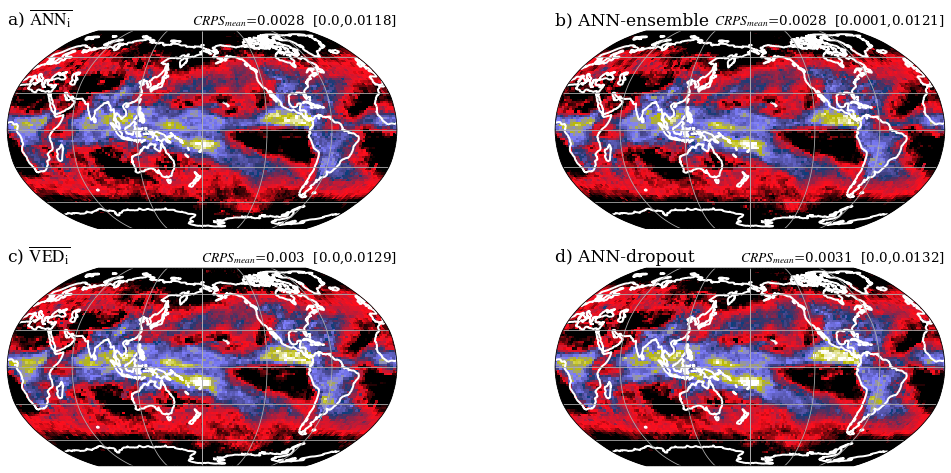

In [69]:
fig, ax = plt.subplots(2,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(18,8))

for isub in range(0,2): # Loop over 4 subplots
    #print(isub)
    isub0 = isub-2*math.floor(isub/2) # Determine location of subplot (out of 4)
    print(isub0)
    for iax in range(2): 
        
        if iax==0: 
            
            if isub0==0: 
                data = np.reshape(deter_7_ANN_lin_CLDICEB_288hPa_mean,(lat.size,lon.size));
                tit = r'a) $\overline{\mathrm{ANN_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_7_ANN_lin_CLDICEB_288hPa_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(deter_7_ANN_lin_CLDICEB_288hPa_mean
                                                                                                      ,2.5),4))+','+str(np.round(np.percentile(deter_7_ANN_lin_CLDICEB_288hPa_mean,97.5),4))+']';

            if isub0==1:
                data = np.reshape(stoch_5_ANN_lin_CLDICEB_288hPa_mean,(lat.size,lon.size));
                tit = r'b) ANN-ensemble';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(stoch_5_ANN_lin_CLDICEB_288hPa_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(stoch_5_ANN_lin_CLDICEB_288hPa_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(stoch_5_ANN_lin_CLDICEB_288hPa_mean,97.5),4))+']';


                
        if iax==1: 
            
            if isub0==0:
                data = np.reshape(deter_6_VED_CLDICEB_288hPa_mean,(lat.size,lon.size));
                tit = r'c) $\overline{\mathrm{VED_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_6_VED_CLDICEB_288hPa_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(deter_6_VED_CLDICEB_288hPa_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(deter_6_VED_CLDICEB_288hPa_mean,97.5),4))+']';


                
            if isub0==1:
                data = np.reshape(ANN_1_lin_dr_0_1_CLDICEB_288hPa_mean,(lat.size,lon.size));
                tit = r'd) ANN-dropout';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(ANN_1_lin_dr_0_1_CLDICEB_288hPa_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(ANN_1_lin_dr_0_1_CLDICEB_288hPa_mean
                                                                                                      ,2.5),4))+','+str(np.round(np.percentile(ANN_1_lin_dr_0_1_CLDICEB_288hPa_mean
                                                                                                                                               ,97.5),4))+']';

                
        iax7 = iax+2*math.floor(isub/2) # To make 6 panels 
        print(iax7)
        imag = ax[iax7][isub0].pcolormesh(lon, lat, data,
                                cmap=seism_CLDICE, vmin=vmin0,vmax=vmax0, 
                                transform=ccrs.PlateCarree())
        ax[iax7][isub].coastlines(color='white',linewidth=2)
        ax[iax7][isub].gridlines()
        ax[iax7][isub].set_title(tit,loc='left',fontsize=fz*0.95)
        ax[iax7][isub].set_title(tit_2,loc='right',fontsize=fz*0.75)

             
            
        # Colorbar
        #if isub==1 and iax==1:
        #    cbar_ax = fig.add_axes([0.35, 0.01, 0.30, 0.05])
        #    cb=fig.colorbar(imag, label="CRPS mean CLDICEBCTEND 288 hPa", cax=cbar_ax,ticks=np.arange(0,0.0252,5E-3),orientation='horizontal')
            

0
0 0
1 0
1
0 1
1 1


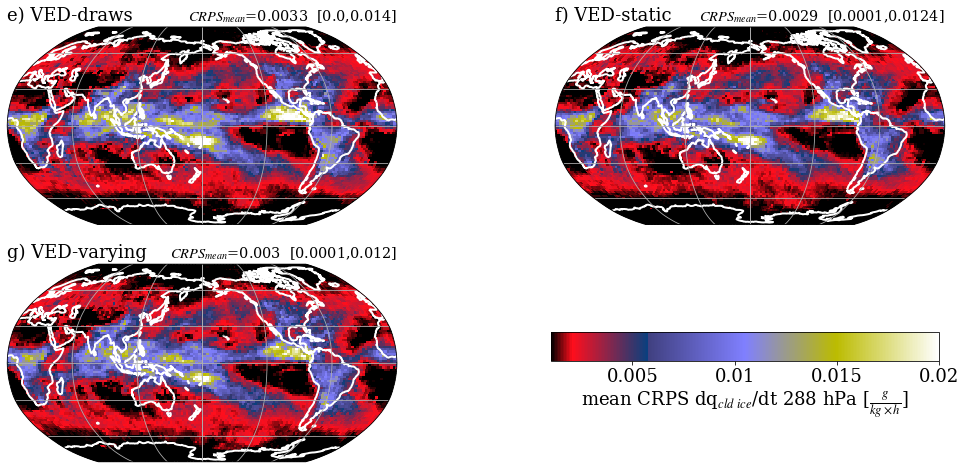

In [43]:
ig, ax = plt.subplots(2,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(18,8))

for isub in range(0,2): # Loop over 4 subplots
    #print(isub)
    isub0 = isub-2*math.floor(isub/2) # Determine location of subplot (out of 4)
    print(isub0)
    for iax in range(2): 
        
        if iax==0: 
            
            if isub0==0: 
                data = np.reshape(VED_1_0_0_7_CLDICEB_288hPa_mean,(lat.size,lon.size));
                tit = r'e) VED-draws';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_0_0_7_CLDICEB_288hPa_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(VED_1_0_0_7_CLDICEB_288hPa_mean
                                                                                                      ,2.5),4))+','+str(np.round(np.percentile(VED_1_0_0_7_CLDICEB_288hPa_mean,97.5),4))+']';

            if isub0==1:
                data = np.reshape(VED_1_0_5_7_CLDICEB_288hPa_mean,(lat.size,lon.size));
                tit = r'f) VED-static';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_0_5_7_CLDICEB_288hPa_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(VED_1_0_5_7_CLDICEB_288hPa_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(VED_1_0_5_7_CLDICEB_288hPa_mean,97.5),4))+']';


                
        if iax==1: 
            
            if isub0==0:
                data = np.reshape(VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean,(lat.size,lon.size));
                tit = r'g) VED-varying';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean,97.5),4))+']';


                
            #if isub0==1:
            #    data = np.reshape(VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean,(lat.size,lon.size));
            #    tit = r'h) VED $\alpha$ array';
            #    tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean)
            #                                                    ,4))+'  ['+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean
            #                                                                                          ,2.5),4))+','+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean
            #                                                                                                                                   ,97.5),4))+']';

                
        iax7 = iax+2*math.floor(isub/2) # To make 6 panels 
        print(iax7,isub)
        
        imag = ax[iax7][isub0].pcolormesh(lon, lat, data,
                                cmap=seism_CLDICE, vmin=vmin0,vmax=vmax0, 
                                transform=ccrs.PlateCarree())
        ax[iax7][isub].coastlines(color='white',linewidth=2)
        ax[iax7][isub].gridlines()
        ax[iax7][isub].set_title(tit,loc='left',fontsize=fz)
        ax[iax7][isub].set_title(tit_2,loc='right',fontsize=fz*0.8)

            
        # Colorbar
        #if isub==1 and iax==1:
cbar_ax = ig.add_axes([0.57, 0.3, 0.30, 0.05])
cb=ig.colorbar(imag, label=r"mean CRPS dq$_{cld \ ice}$/dt 288 hPa [$\frac{g}{kg \times h}$]", cax=cbar_ax,ticks=np.arange(0,0.0252,5E-3),orientation='horizontal')
ig.delaxes(ax[1][1])    
cb.set_ticklabels(np.arange(0,0.0252,5E-3),fontsize=fz)
cb.set_label(label=r"mean CRPS dq$_{cld \ ice}$/dt 288 hPa [$\frac{g}{kg \times h}$]",fontsize=fz)

            

0
0
1
2
1
0
1
2


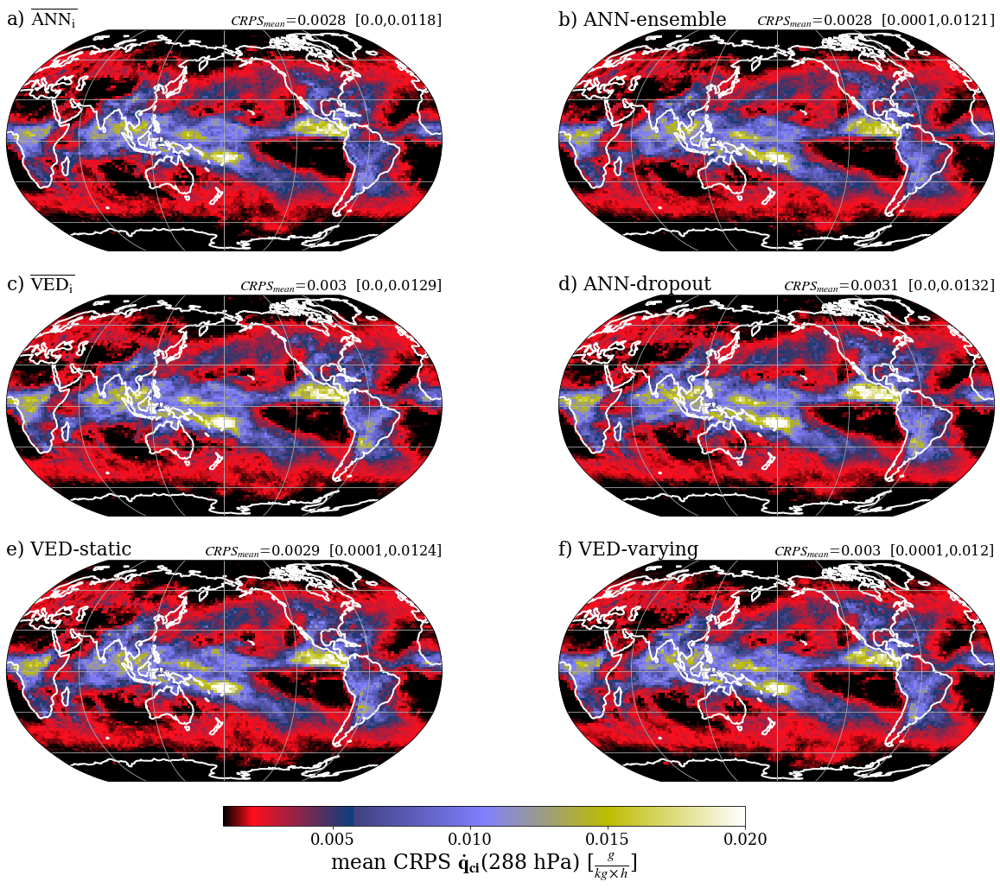

In [71]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,16))

for isub in range(0,2): # Loop over 4 subplots
    #print(isub)
    isub0 = isub-2*math.floor(isub/2) # Determine location of subplot (out of 4)
    print(isub0)
    for iax in range(3): 
        
        if iax==0: 
            
            if isub0==0: 
                data = np.reshape(deter_7_ANN_lin_CLDICEB_288hPa_mean,(lat.size,lon.size));
                tit = r'a) $\overline{\mathrm{ANN_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_7_ANN_lin_CLDICEB_288hPa_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(deter_7_ANN_lin_CLDICEB_288hPa_mean
                                                                                                      ,2.5),4))+','+str(np.round(np.percentile(deter_7_ANN_lin_CLDICEB_288hPa_mean,97.5),4))+']';

            if isub0==1:
                data = np.reshape(stoch_5_ANN_lin_CLDICEB_288hPa_mean,(lat.size,lon.size));
                tit = r'b) ANN-ensemble';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(stoch_5_ANN_lin_CLDICEB_288hPa_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(stoch_5_ANN_lin_CLDICEB_288hPa_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(stoch_5_ANN_lin_CLDICEB_288hPa_mean,97.5),4))+']';


                
        if iax==1: 
            
            if isub0==0:
                data = np.reshape(deter_6_VED_CLDICEB_288hPa_mean,(lat.size,lon.size));
                tit = r'c) $\overline{\mathrm{VED_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_6_VED_CLDICEB_288hPa_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(deter_6_VED_CLDICEB_288hPa_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(deter_6_VED_CLDICEB_288hPa_mean,97.5),4))+']';


                
            if isub0==1:
                data = np.reshape(ANN_1_lin_dr_0_1_CLDICEB_288hPa_mean,(lat.size,lon.size));
                tit = r'd) ANN-dropout';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(ANN_1_lin_dr_0_1_CLDICEB_288hPa_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(ANN_1_lin_dr_0_1_CLDICEB_288hPa_mean
                                                                                                      ,2.5),4))+','+str(np.round(np.percentile(ANN_1_lin_dr_0_1_CLDICEB_288hPa_mean
                                                                                                                                               ,97.5),4))+']';
            

        if iax==2:
            
        
            if isub0==0:
                data = np.reshape(VED_1_0_5_7_CLDICEB_288hPa_mean,(lat.size,lon.size));
                tit = r'e) VED-static';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_0_5_7_CLDICEB_288hPa_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(VED_1_0_5_7_CLDICEB_288hPa_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(VED_1_0_5_7_CLDICEB_288hPa_mean,97.5),4))+']';
            
            if isub0==1:
                data = np.reshape(VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean,(lat.size,lon.size));
                tit = r'f) VED-varying';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean,97.5),4))+']';


        
        
        
        
        
        
        
        iax7 = iax+2*math.floor(isub/2) # To make 6 panels 
        print(iax7)
        imag = ax[iax7][isub0].pcolormesh(lon, lat, data,
                                cmap=seism_CLDICE, vmin=vmin0,vmax=vmax0, 
                                transform=ccrs.PlateCarree())
        ax[iax7][isub].coastlines(color='white',linewidth=2)
        ax[iax7][isub].gridlines()
        ax[iax7][isub].set_title(tit,loc='left')
        ax[iax7][isub].set_title(tit_2,loc='right',fontsize=fz*0.9)

cbar_ax = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=fig.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{q}_{ci}}$(288 hPa) [$\frac{g}{kg \times h}$]", cax=cbar_ax,ticks=np.arange(0,0.022,5E-3),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{q}_{ci}}$(288 hPa) [$\frac{g}{kg \times h}$]",fontsize=fz*1.3)
             
            


compute CRPS skill scores: 

\begin{align}
CRPS_skill_score= 1-(\frac{CRPS_{param}}{CRPS_{\overline{\mathrm{ANN}}})
\end{align}


In [30]:
stoch_5_CRPS_CLDICEBCTEND_288_skill_score=1-(stoch_5_ANN_lin_CLDICEB_288hPa_mean/deter_7_ANN_lin_CLDICEB_288hPa_mean)

In [31]:
deter_6_VED_CRPS_CLDICEBCTEND_288_skill_score=1-(deter_6_VED_CLDICEB_288hPa_mean/deter_7_ANN_lin_CLDICEB_288hPa_mean)

In [32]:
ANN_dropout_0_01_CRPS_CLDICEBCTEND_288_skill_score=1-(ANN_1_lin_dr_0_1_CLDICEB_288hPa_mean/deter_7_ANN_lin_CLDICEB_288hPa_mean)

In [33]:
VED_static_CRPS_CLDICEBCTEND_288_skill_score=1-(VED_1_0_5_7_CLDICEB_288hPa_mean/deter_7_ANN_lin_CLDICEB_288hPa_mean)

In [34]:
VED_varying_CRPS_CLDICEBCTEND_288_skill_score=1-(VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean/deter_7_ANN_lin_CLDICEB_288hPa_mean)

and differences: CRPS_{param} - CRPS_{\overline{\mathrm{ANN}}}

In [35]:
stoch_5_CRPS_CLDICEBCTEND_288_diff=stoch_5_ANN_lin_CLDICEB_288hPa_mean-deter_7_ANN_lin_CLDICEB_288hPa_mean

In [36]:
deter_6_VED_CRPS_CLDICEBCTEND_288_diff=deter_6_VED_CLDICEB_288hPa_mean-deter_7_ANN_lin_CLDICEB_288hPa_mean

In [37]:
ANN_dropout_0_01_CRPS_CLDICEBCTEND_288_diff=ANN_1_lin_dr_0_1_CLDICEB_288hPa_mean-deter_7_ANN_lin_CLDICEB_288hPa_mean

In [38]:
VED_static_CRPS_CLDICEBCTEND_288_diff=VED_1_0_5_7_CLDICEB_288hPa_mean-deter_7_ANN_lin_CLDICEB_288hPa_mean

In [39]:
VED_varying_CRPS_CLDICEBCTEND_288_diff=VED_1_alpha_arr_1_7_CLDICEB_288hPa_mean-deter_7_ANN_lin_CLDICEB_288hPa_mean


In [40]:
seims_diff_cloud_ice,norm_diff_cloud_ice=color_map_personalizer_diff(20,-0.005,0.005)

Text(0.0, 1.0, 'f) VED-varying')

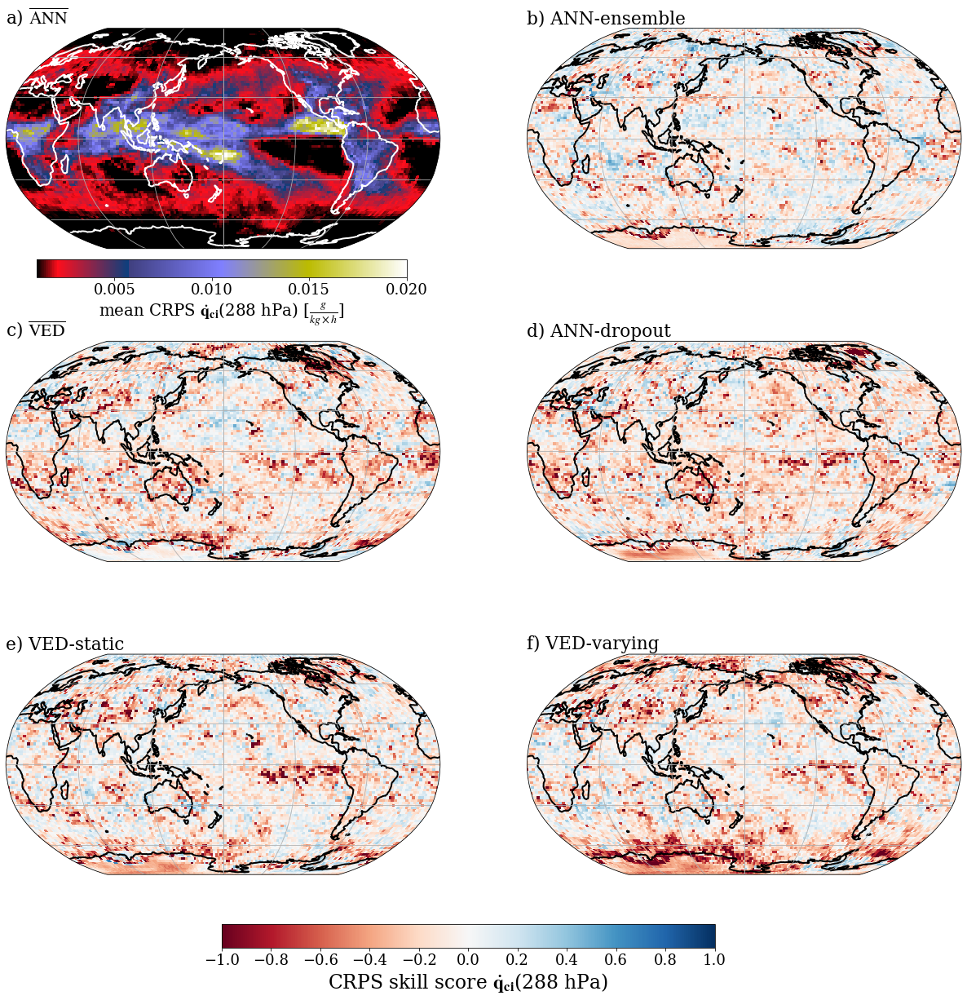

In [82]:
#plot skill scores

fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,20))

imag=ax[0][0].pcolormesh(lon,lat,np.reshape(deter_7_ANN_lin_CLDICEB_288hPa_mean,(lat.size,lon.size)),
                                cmap=seism_CLDICE, vmin=vmin0,vmax=vmax0, 
                                transform=ccrs.PlateCarree())
ax[0][0].coastlines(color='white',linewidth=2)
ax[0][0].gridlines()
ax[0][0].set_title(r'a) $\overline{\mathrm{ANN}}$',loc='left')
cbar_ax=fig.add_axes([0.15, 0.651, 0.30, 0.015])
cb=plt.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{q}_{ci}}$(288 hPa) [$\frac{g}{kg \times h}$]",cax=cbar_ax,ticks=np.arange(0,0.022,5E-3),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{q}_{ci}}$(288 hPa) [$\frac{g}{kg \times h}$]",fontsize=fz*1.1)
             
imag_2=ax[0][1].pcolormesh(lon,lat,np.reshape(stoch_5_CRPS_CLDICEBCTEND_288_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[0][1].coastlines(color='black',linewidth=2)
ax[0][1].gridlines()
ax[0][1].set_title(r'b) ANN-ensemble',loc='left')
    
cbar_ax_2 = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=plt.colorbar(imag_2,cax=cbar_ax_2,ticks=np.arange(-1,1.022,2E-1),orientation='horizontal')
cb.set_label(label=r"CRPS skill score $\mathbf{\dot{q}_{ci}}$(288 hPa)",fontsize=fz*1.3)    


ax[1][0].pcolormesh(lon,lat,np.reshape(deter_6_VED_CRPS_CLDICEBCTEND_288_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[1][0].coastlines(color='black',linewidth=2)
ax[1][0].gridlines()
ax[1][0].set_title(r'c) $\overline{\mathrm{VED}}$',loc='left')



ax[1][1].pcolormesh(lon,lat,np.reshape(ANN_dropout_0_01_CRPS_CLDICEBCTEND_288_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[1][1].coastlines(color='black',linewidth=2)
ax[1][1].gridlines()
ax[1][1].set_title(r'd) ANN-dropout',loc='left')

ax[2][0].pcolormesh(lon,lat,np.reshape(VED_static_CRPS_CLDICEBCTEND_288_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[2][0].coastlines(color='black',linewidth=2)
ax[2][0].gridlines()
ax[2][0].set_title(r'e) VED-static',loc='left')


ax[2][1].pcolormesh(lon,lat,np.reshape(VED_varying_CRPS_CLDICEBCTEND_288_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[2][1].coastlines(color='black',linewidth=2)
ax[2][1].gridlines()
ax[2][1].set_title(r'f) VED-varying',loc='left')



Text(0.0, 1.0, 'f) VED-varying')

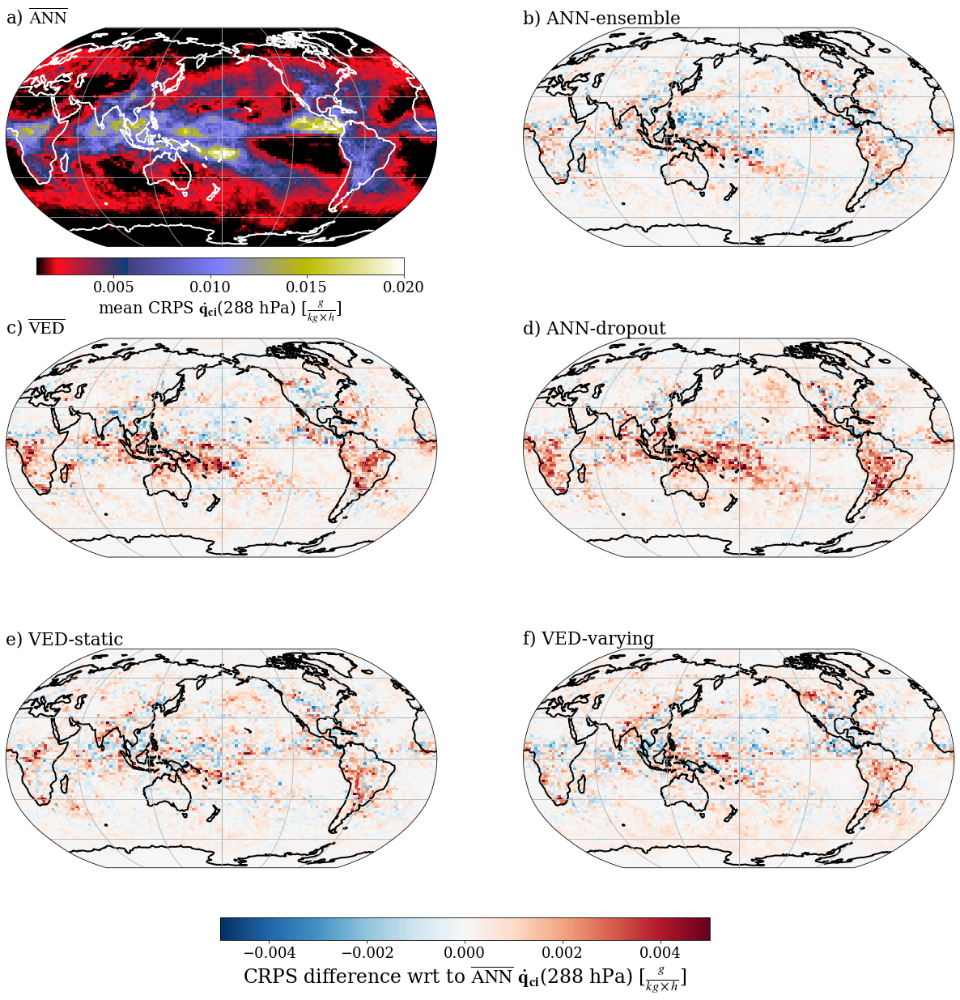

In [83]:
# plot differences

fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,20))

imag=ax[0][0].pcolormesh(lon,lat,np.reshape(deter_7_ANN_lin_CLDICEB_288hPa_mean,(lat.size,lon.size)),
                                cmap=seism_CLDICE, vmin=vmin0,vmax=vmax0, 
                                transform=ccrs.PlateCarree())
ax[0][0].coastlines(color='white',linewidth=2)
ax[0][0].gridlines()
ax[0][0].set_title(r'a) $\overline{\mathrm{ANN}}$',loc='left')
cbar_ax=fig.add_axes([0.15, 0.651, 0.30, 0.015])
cb=plt.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{q}_{ci}}$(288 hPa) [$\frac{g}{kg \times h}$]",cax=cbar_ax,ticks=np.arange(0,0.022,5E-3),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{q}_{ci}}$(288 hPa) [$\frac{g}{kg \times h}$]",fontsize=fz*1.1)
             
imag_2=ax[0][1].pcolormesh(lon,lat,np.reshape(stoch_5_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005, 
                                transform=ccrs.PlateCarree())
ax[0][1].coastlines(color='black',linewidth=2)
ax[0][1].gridlines()
ax[0][1].set_title(r'b) ANN-ensemble',loc='left')
    
cbar_ax_2 = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=plt.colorbar(imag_2,cax=cbar_ax_2,ticks=np.arange(-0.01,0.01,2E-3),orientation='horizontal')
cb.set_label(label=r"CRPS difference wrt to $\overline{\mathrm{ANN}}$ $\mathbf{\dot{q}_{ci}}$(288 hPa) [$\frac{g}{kg \times h}$]",fontsize=fz*1.3)    


ax[1][0].pcolormesh(lon,lat,np.reshape(deter_6_VED_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005,  
                                transform=ccrs.PlateCarree())
ax[1][0].coastlines(color='black',linewidth=2)
ax[1][0].gridlines()
ax[1][0].set_title(r'c) $\overline{\mathrm{VED}}$',loc='left')



ax[1][1].pcolormesh(lon,lat,np.reshape(ANN_dropout_0_01_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005,  
                                transform=ccrs.PlateCarree())
ax[1][1].coastlines(color='black',linewidth=2)
ax[1][1].gridlines()
ax[1][1].set_title(r'd) ANN-dropout',loc='left')

ax[2][0].pcolormesh(lon,lat,np.reshape(VED_static_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005,  
                                transform=ccrs.PlateCarree())
ax[2][0].coastlines(color='black',linewidth=2)
ax[2][0].gridlines()
ax[2][0].set_title(r'e) VED-static',loc='left')


ax[2][1].pcolormesh(lon,lat,np.reshape(VED_varying_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005, 
                                transform=ccrs.PlateCarree())
ax[2][1].coastlines(color='black',linewidth=2)
ax[2][1].gridlines()
ax[2][1].set_title(r'f) VED-varying',loc='left')



Text(0.0, 1.0, 'f) VED-varying')

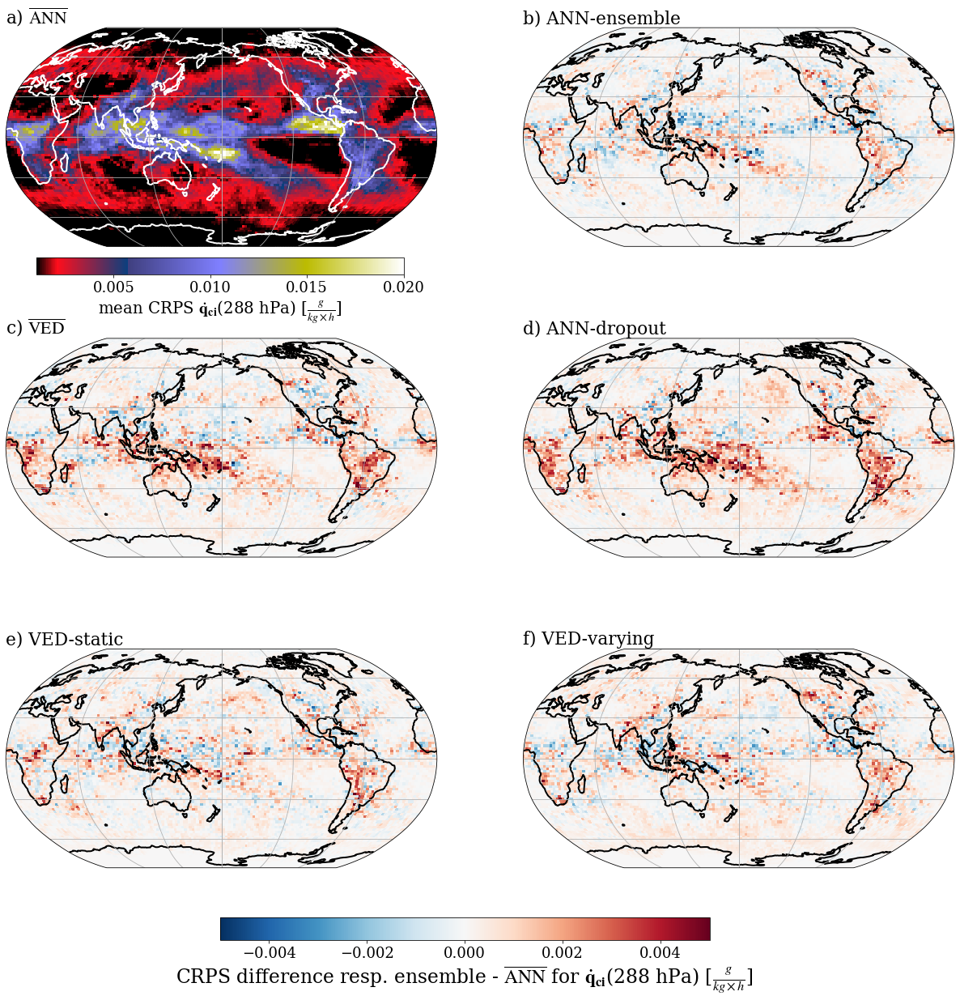

In [85]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,20))

imag=ax[0][0].pcolormesh(lon,lat,np.reshape(deter_7_ANN_lin_CLDICEB_288hPa_mean,(lat.size,lon.size)),
                                cmap=seism_CLDICE, vmin=vmin0,vmax=vmax0, 
                                transform=ccrs.PlateCarree())
ax[0][0].coastlines(color='white',linewidth=2)
ax[0][0].gridlines()
ax[0][0].set_title(r'a) $\overline{\mathrm{ANN}}$',loc='left')
cbar_ax=fig.add_axes([0.15, 0.651, 0.30, 0.015])
cb=plt.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{q}_{ci}}$(288 hPa) [$\frac{g}{kg \times h}$]",cax=cbar_ax,ticks=np.arange(0,0.022,5E-3),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{q}_{ci}}$(288 hPa) [$\frac{g}{kg \times h}$]",fontsize=fz*1.1)
             
imag_2=ax[0][1].pcolormesh(lon,lat,np.reshape(stoch_5_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005, 
                                transform=ccrs.PlateCarree())
ax[0][1].coastlines(color='black',linewidth=2)
ax[0][1].gridlines()
ax[0][1].set_title(r'b) ANN-ensemble',loc='left')
    
cbar_ax_2 = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=plt.colorbar(imag_2,cax=cbar_ax_2,ticks=np.arange(-0.01,0.01,2E-3),orientation='horizontal')
cb.set_label(label=r"CRPS difference resp. ensemble - $\overline{\mathrm{ANN}}$ for $\mathbf{\dot{q}_{ci}}$(288 hPa) [$\frac{g}{kg \times h}$]",fontsize=fz*1.3)    


ax[1][0].pcolormesh(lon,lat,np.reshape(deter_6_VED_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005,  
                                transform=ccrs.PlateCarree())
ax[1][0].coastlines(color='black',linewidth=2)
ax[1][0].gridlines()
ax[1][0].set_title(r'c) $\overline{\mathrm{VED}}$',loc='left')



ax[1][1].pcolormesh(lon,lat,np.reshape(ANN_dropout_0_01_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005,  
                                transform=ccrs.PlateCarree())
ax[1][1].coastlines(color='black',linewidth=2)
ax[1][1].gridlines()
ax[1][1].set_title(r'd) ANN-dropout',loc='left')

ax[2][0].pcolormesh(lon,lat,np.reshape(VED_static_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005,  
                                transform=ccrs.PlateCarree())
ax[2][0].coastlines(color='black',linewidth=2)
ax[2][0].gridlines()
ax[2][0].set_title(r'e) VED-static',loc='left')


ax[2][1].pcolormesh(lon,lat,np.reshape(VED_varying_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005, 
                                transform=ccrs.PlateCarree())
ax[2][1].coastlines(color='black',linewidth=2)
ax[2][1].gridlines()
ax[2][1].set_title(r'f) VED-varying',loc='left')



Text(0.0, 1.0, 'f) VED-varying')

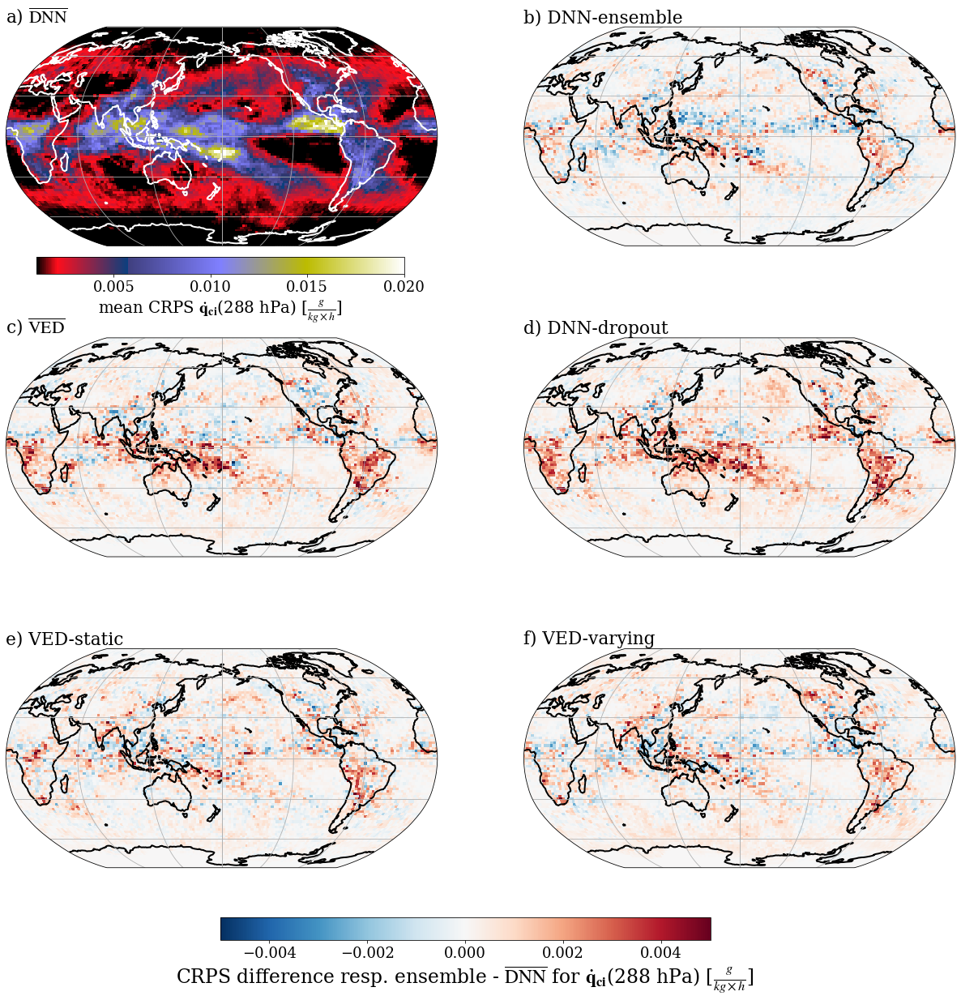

In [44]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,20))

imag=ax[0][0].pcolormesh(lon,lat,np.reshape(deter_7_ANN_lin_CLDICEB_288hPa_mean,(lat.size,lon.size)),
                                cmap=seism_CLDICE, vmin=vmin0,vmax=vmax0, 
                                transform=ccrs.PlateCarree())
ax[0][0].coastlines(color='white',linewidth=2)
ax[0][0].gridlines()
ax[0][0].set_title(r'a) $\overline{\mathrm{DNN}}$',loc='left')
cbar_ax=fig.add_axes([0.15, 0.651, 0.30, 0.015])
cb=plt.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{q}_{ci}}$(288 hPa) [$\frac{g}{kg \times h}$]",cax=cbar_ax,ticks=np.arange(0,0.022,5E-3),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{q}_{ci}}$(288 hPa) [$\frac{g}{kg \times h}$]",fontsize=fz*1.1)
             
imag_2=ax[0][1].pcolormesh(lon,lat,np.reshape(stoch_5_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005, 
                                transform=ccrs.PlateCarree())
ax[0][1].coastlines(color='black',linewidth=2)
ax[0][1].gridlines()
ax[0][1].set_title(r'b) DNN-ensemble',loc='left')
    
cbar_ax_2 = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=plt.colorbar(imag_2,cax=cbar_ax_2,ticks=np.arange(-0.01,0.01,2E-3),orientation='horizontal')
cb.set_label(label=r"CRPS difference resp. ensemble - $\overline{\mathrm{DNN}}$ for $\mathbf{\dot{q}_{ci}}$(288 hPa) [$\frac{g}{kg \times h}$]",fontsize=fz*1.3)    


ax[1][0].pcolormesh(lon,lat,np.reshape(deter_6_VED_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005,  
                                transform=ccrs.PlateCarree())
ax[1][0].coastlines(color='black',linewidth=2)
ax[1][0].gridlines()
ax[1][0].set_title(r'c) $\overline{\mathrm{VED}}$',loc='left')



ax[1][1].pcolormesh(lon,lat,np.reshape(ANN_dropout_0_01_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005,  
                                transform=ccrs.PlateCarree())
ax[1][1].coastlines(color='black',linewidth=2)
ax[1][1].gridlines()
ax[1][1].set_title(r'd) DNN-dropout',loc='left')

ax[2][0].pcolormesh(lon,lat,np.reshape(VED_static_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005,  
                                transform=ccrs.PlateCarree())
ax[2][0].coastlines(color='black',linewidth=2)
ax[2][0].gridlines()
ax[2][0].set_title(r'e) VED-static',loc='left')


ax[2][1].pcolormesh(lon,lat,np.reshape(VED_varying_CRPS_CLDICEBCTEND_288_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_ice, vmin=-0.005,vmax=0.005, 
                                transform=ccrs.PlateCarree())
ax[2][1].coastlines(color='black',linewidth=2)
ax[2][1].gridlines()
ax[2][1].set_title(r'f) VED-varying',loc='left')



# mean CRPS for $\dot{q}_{cl}$ on 831 hPa in the planetary boundary layer 

In [45]:
vmin_1=0.0; vmax_1=0.04

In [46]:
seism_CLDLIQ,norm_seism=color_map_personalizer(20,vmin_1,vmax_1)

0
0
1
1
0
1


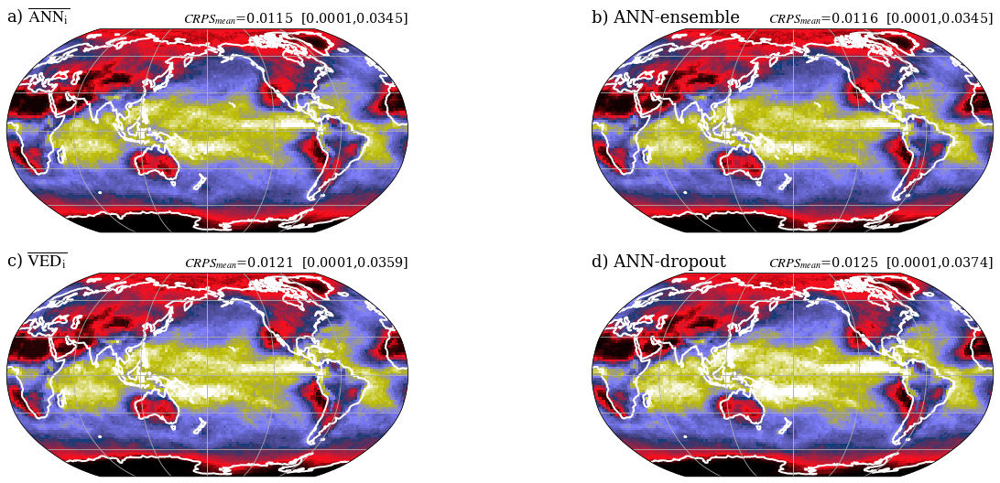

In [46]:
fig, ax = plt.subplots(2,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,9))

for isub in range(0,2): # Loop over 4 subplots
    #print(isub)
    isub0 = isub-2*math.floor(isub/2) # Determine location of subplot (out of 4)
    print(isub0)
    for iax in range(2): 
        
        if iax==0: 
            
            if isub0==0: 
                data = np.reshape(deter_7_ANN_lin_CLDLIQBC_831_mean,(lat.size,lon.size));
                tit = r'a) $\overline{\mathrm{ANN_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_7_ANN_lin_CLDLIQBC_831_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(deter_7_ANN_lin_CLDLIQBC_831_mean
                                                                                                      ,2.5),4))+','+str(np.round(np.percentile(deter_7_ANN_lin_CLDLIQBC_831_mean,97.5),4))+']';

            if isub0==1:
                data = np.reshape(stoch_5_ANN_lin_CLDLIQBC_831_mean,(lat.size,lon.size));
                tit = r'b) ANN-ensemble';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(stoch_5_ANN_lin_CLDLIQBC_831_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(stoch_5_ANN_lin_CLDLIQBC_831_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(stoch_5_ANN_lin_CLDLIQBC_831_mean,97.5),4))+']';


                
        if iax==1: 
            
            if isub0==0:
                data = np.reshape(deter_6_VED_CLDLIQBC_831_mean,(lat.size,lon.size));
                tit = r'c) $\overline{\mathrm{VED_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_6_VED_CLDLIQBC_831_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(deter_6_VED_CLDLIQBC_831_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(deter_6_VED_CLDLIQBC_831_mean,97.5),4))+']';


                
            if isub0==1:
                data = np.reshape(ANN_1_lin_dr_0_1_CLDLIQBC_831_mean,(lat.size,lon.size));
                tit = r'd) ANN-dropout';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(ANN_1_lin_dr_0_1_CLDLIQBC_831_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(ANN_1_lin_dr_0_1_CLDLIQBC_831_mean
                                                                                                      ,2.5),4))+','+str(np.round(np.percentile(ANN_1_lin_dr_0_1_CLDLIQBC_831_mean
                                                                                                                                               ,97.5),4))+']';

                
        iax7 = iax+2*math.floor(isub/2) # To make 6 panels 
        print(iax7)
        imag = ax[iax7][isub0].pcolormesh(lon, lat, data,
                                cmap=seism_CLDLIQ, vmin=vmin_1,vmax=vmax_1, 
                                transform=ccrs.PlateCarree())
        ax[iax7][isub].coastlines(color='white',linewidth=2)
        ax[iax7][isub].gridlines()
        ax[iax7][isub].set_title(tit,loc='left',fontsize=fz)
        ax[iax7][isub].set_title(tit_2,loc='right',fontsize=fz*0.8)

             
            
       

0
0 0
1 0
1
0 1
1 1


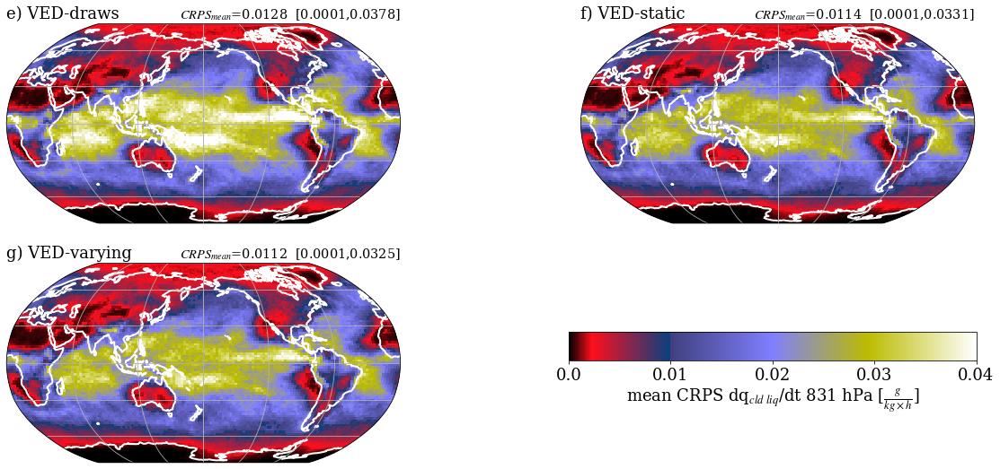

In [48]:
fig, ax = plt.subplots(2,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,9))

for isub in range(0,2): # Loop over 4 subplots
    #print(isub)
    isub0 = isub-2*math.floor(isub/2) # Determine location of subplot (out of 4)
    print(isub0)
    for iax in range(2): 
        
        if iax==0: 
            
            if isub0==0: 
                data = np.reshape(VED_1_0_0_7_CLDLIQBC_831_mean,(lat.size,lon.size));
                tit = r'e) VED-draws';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_0_0_7_CLDLIQBC_831_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(VED_1_0_0_7_CLDLIQBC_831_mean
                                                                                                      ,2.5),4))+','+str(np.round(np.percentile(VED_1_0_0_7_CLDLIQBC_831_mean,97.5),4))+']';

            if isub0==1:
                data = np.reshape(VED_1_0_5_7_CLDLIQBC_831_mean,(lat.size,lon.size));
                tit = r'f) VED-static';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_0_5_7_CLDLIQBC_831_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(VED_1_0_5_7_CLDLIQBC_831_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(VED_1_0_5_7_CLDLIQBC_831_mean,97.5),4))+']';


                
        if iax==1: 
            
            if isub0==0:
                data = np.reshape(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean,(lat.size,lon.size));
                tit = r'g) VED-varying';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean,97.5),4))+']';


                
            #if isub0==1:
            #    data = np.reshape(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean,(lat.size,lon.size));
            #    tit = r'h) VED $\alpha$ array';
            #     tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean)
           #                                                     ,4))+'  ['+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean
            #                                                                                          ,2.5),4))+','+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean
            #                                                                                                                                   ,97.5),4))+']';

                
        
             
            
                      
        iax7 = iax+2*math.floor(isub/2) # To make 6 panels 
        print(iax7,isub)
        
        imag = ax[iax7][isub0].pcolormesh(lon, lat, data,
                                cmap=seism_CLDLIQ, vmin=vmin_1,vmax=vmax_1, 
                                transform=ccrs.PlateCarree())
        ax[iax7][isub].coastlines(color='white',linewidth=2)
        ax[iax7][isub].gridlines()
        ax[iax7][isub].set_title(tit,loc='left',fontsize=fz)
        ax[iax7][isub].set_title(tit_2,loc='right',fontsize=fz*0.8)

            
        # Colorbar
        #if isub==1 and iax==1:
cbar_ax = fig.add_axes([0.57, 0.3, 0.30, 0.05])
cb=fig.colorbar(imag, label=r"mean CRPS dq$_{cld \ liq}$/dt 831 hPa [$\frac{g}{kg \times h}$]", cax=cbar_ax,ticks=np.arange(0,0.042,10E-3),orientation='horizontal')

fig.delaxes(ax[1][1])   
cb.set_ticklabels(np.arange(0,0.042,10E-3),fontsize=fz)
cb.set_label(label=r"mean CRPS dq$_{cld \ liq}$/dt 831 hPa [$\frac{g}{kg \times h}$]",fontsize=fz)

            

0
0
1
2
1
0
1
2


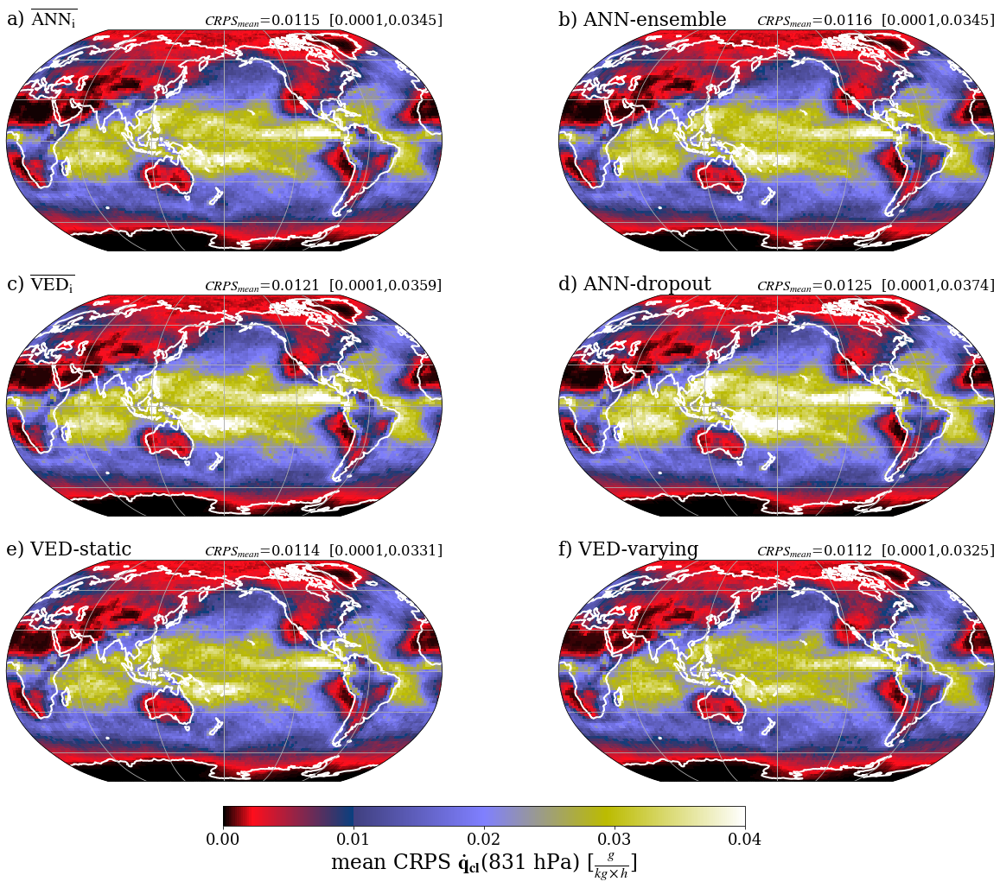

In [66]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,16))

for isub in range(0,2): # Loop over 4 subplots
    #print(isub)
    isub0 = isub-2*math.floor(isub/2) # Determine location of subplot (out of 4)
    print(isub0)
    for iax in range(3): 
        
        if iax==0: 
            
            if isub0==0: 
                data = np.reshape(deter_7_ANN_lin_CLDLIQBC_831_mean,(lat.size,lon.size));
                tit = r'a) $\overline{\mathrm{ANN_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_7_ANN_lin_CLDLIQBC_831_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(deter_7_ANN_lin_CLDLIQBC_831_mean
                                                                                                      ,2.5),4))+','+str(np.round(np.percentile(deter_7_ANN_lin_CLDLIQBC_831_mean,97.5),4))+']';

            if isub0==1:
                data = np.reshape(stoch_5_ANN_lin_CLDLIQBC_831_mean,(lat.size,lon.size));
                tit = r'b) ANN-ensemble';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(stoch_5_ANN_lin_CLDLIQBC_831_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(stoch_5_ANN_lin_CLDLIQBC_831_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(stoch_5_ANN_lin_CLDLIQBC_831_mean,97.5),4))+']';


                
        if iax==1: 
            
            if isub0==0:
                data = np.reshape(deter_6_VED_CLDLIQBC_831_mean,(lat.size,lon.size));
                tit = r'c) $\overline{\mathrm{VED_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_6_VED_CLDLIQBC_831_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(deter_6_VED_CLDLIQBC_831_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(deter_6_VED_CLDLIQBC_831_mean,97.5),4))+']';


                
            if isub0==1:
                data = np.reshape(ANN_1_lin_dr_0_1_CLDLIQBC_831_mean,(lat.size,lon.size));
                tit = r'd) ANN-dropout';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(ANN_1_lin_dr_0_1_CLDLIQBC_831_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(ANN_1_lin_dr_0_1_CLDLIQBC_831_mean
                                                                                                      ,2.5),4))+','+str(np.round(np.percentile(ANN_1_lin_dr_0_1_CLDLIQBC_831_mean
                                                                                                                                               ,97.5),4))+']';
            

        if iax==2:
            
        
            if isub0==0:
                data = np.reshape(VED_1_0_5_7_CLDLIQBC_831_mean,(lat.size,lon.size));
                tit = r'e) VED-static';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_0_5_7_CLDLIQBC_831_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(VED_1_0_5_7_CLDLIQBC_831_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(VED_1_0_5_7_CLDLIQBC_831_mean,97.5),4))+']';
            
            if isub0==1:
                data = np.reshape(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean,(lat.size,lon.size));
                tit = r'f) VED-varying';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean,97.5),4))+']';


        
        
        
        
        
        
        
        iax7 = iax+2*math.floor(isub/2) # To make 6 panels 
        print(iax7)
        imag = ax[iax7][isub0].pcolormesh(lon, lat, data,
                                cmap=seism_CLDLIQ, vmin=vmin_1,vmax=vmax_1, 
                                transform=ccrs.PlateCarree())
        ax[iax7][isub].coastlines(color='white',linewidth=2)
        ax[iax7][isub].gridlines()
        ax[iax7][isub].set_title(tit,loc='left')
        ax[iax7][isub].set_title(tit_2,loc='right',fontsize=fz*0.9)

cbar_ax = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=fig.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{q}_{cl}}$(831 hPa) [$\frac{g}{kg \times h}$]", cax=cbar_ax,ticks=np.arange(0,0.042,10E-3),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{q}_{cl}}$(831 hPa) [$\frac{g}{kg \times h}$]",fontsize=fz*1.3)
             
            

In [51]:
#compute skill scores and differences for cloud liquid tendencies on 831 hPa 

stoch_5_CRPS_CLDLIQBCTEND_831_skill_score=1-(stoch_5_ANN_lin_CLDLIQBC_831_mean/deter_7_ANN_lin_CLDLIQBC_831_mean)

deter_VED_6_CRPS_CLDLIQBCTEND_831_skill_score=1-(deter_6_VED_CLDLIQBC_831_mean/deter_7_ANN_lin_CLDLIQBC_831_mean)

ANN_dropout_CRPS_CLDLIQBCTEND_831_skill_score=1-(ANN_1_lin_dr_0_1_CLDLIQBC_831_mean/deter_7_ANN_lin_CLDLIQBC_831_mean)

static_VED_CRPS_CLDLIQBCTEND_831_skill_score=1-(VED_1_0_5_7_CLDLIQBC_831_mean/deter_7_ANN_lin_CLDLIQBC_831_mean)

varying_VED_CRPS_CLDLIQBCTEND_831_skill_score=1-(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean/deter_7_ANN_lin_CLDLIQBC_831_mean)

stoch_5_CRPS_CLDLIQBCTEND_831_diff=stoch_5_ANN_lin_CLDLIQBC_831_mean-deter_7_ANN_lin_CLDLIQBC_831_mean

deter_VED_6_CRPS_CLDLIQBCTEND_831_diff=deter_6_VED_CLDLIQBC_831_mean-deter_7_ANN_lin_CLDLIQBC_831_mean

ANN_dropout_CRPS_CLDLIQBCTEND_831_diff=ANN_1_lin_dr_0_1_CLDLIQBC_831_mean-deter_7_ANN_lin_CLDLIQBC_831_mean

static_VED_CRPS_CLDLIQBCTEND_831_diff=VED_1_0_5_7_CLDLIQBC_831_mean-deter_7_ANN_lin_CLDLIQBC_831_mean

varying_VED_CRPS_CLDLIQBCTEND_831_diff=VED_1_alpha_arr_1_7_CLDLIQBC_831_mean-deter_7_ANN_lin_CLDLIQBC_831_mean

In [52]:
seims_diff_cloud_liq,norm_diff_cloud_liq=color_map_personalizer_diff(20,-0.01,0.01)

Text(0.0, 1.0, 'f) VED-varying')

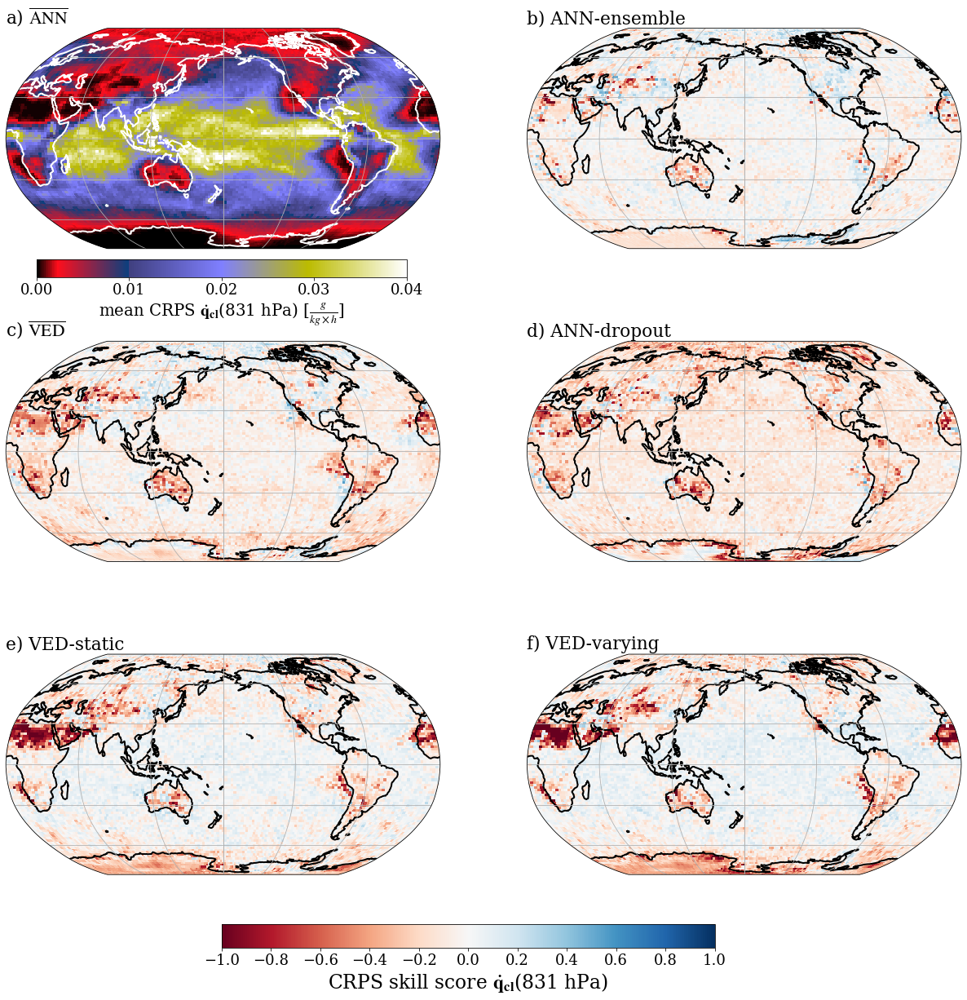

In [67]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,20))

imag=ax[0][0].pcolormesh(lon,lat,np.reshape(deter_7_ANN_lin_CLDLIQBC_831_mean,(lat.size,lon.size)),
                                cmap=seism_CLDLIQ, vmin=vmin_1,vmax=vmax_1, 
                                transform=ccrs.PlateCarree())
ax[0][0].coastlines(color='white',linewidth=2)
ax[0][0].gridlines()
ax[0][0].set_title(r'a) $\overline{\mathrm{ANN}}$',loc='left')
cbar_ax=fig.add_axes([0.15, 0.651, 0.30, 0.015])
cb=plt.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{q}_{cl}}$(831 hPa) [$\frac{g}{kg \times h}$]",cax=cbar_ax,ticks=np.arange(0,0.042,10E-3),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{q}_{cl}}$(831 hPa) [$\frac{g}{kg \times h}$]",fontsize=fz*1.1)
             
imag_2=ax[0][1].pcolormesh(lon,lat,np.reshape(stoch_5_CRPS_CLDLIQBCTEND_831_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[0][1].coastlines(color='black',linewidth=2)
ax[0][1].gridlines()
ax[0][1].set_title(r'b) ANN-ensemble',loc='left')
    
cbar_ax_2 = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=plt.colorbar(imag_2,cax=cbar_ax_2,ticks=np.arange(-1,1.022,2E-1),orientation='horizontal')
cb.set_label(label=r"CRPS skill score $\mathbf{\dot{q}_{cl}}$(831 hPa)",fontsize=fz*1.3)    


ax[1][0].pcolormesh(lon,lat,np.reshape(deter_VED_6_CRPS_CLDLIQBCTEND_831_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[1][0].coastlines(color='black',linewidth=2)
ax[1][0].gridlines()
ax[1][0].set_title(r'c) $\overline{\mathrm{VED}}$',loc='left')



ax[1][1].pcolormesh(lon,lat,np.reshape(ANN_dropout_CRPS_CLDLIQBCTEND_831_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[1][1].coastlines(color='black',linewidth=2)
ax[1][1].gridlines()
ax[1][1].set_title(r'd) ANN-dropout',loc='left')

ax[2][0].pcolormesh(lon,lat,np.reshape(static_VED_CRPS_CLDLIQBCTEND_831_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[2][0].coastlines(color='black',linewidth=2)
ax[2][0].gridlines()
ax[2][0].set_title(r'e) VED-static',loc='left')


ax[2][1].pcolormesh(lon,lat,np.reshape(varying_VED_CRPS_CLDLIQBCTEND_831_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[2][1].coastlines(color='black',linewidth=2)
ax[2][1].gridlines()
ax[2][1].set_title(r'f) VED-varying',loc='left')



Text(0.0, 1.0, 'f) VED-varying')

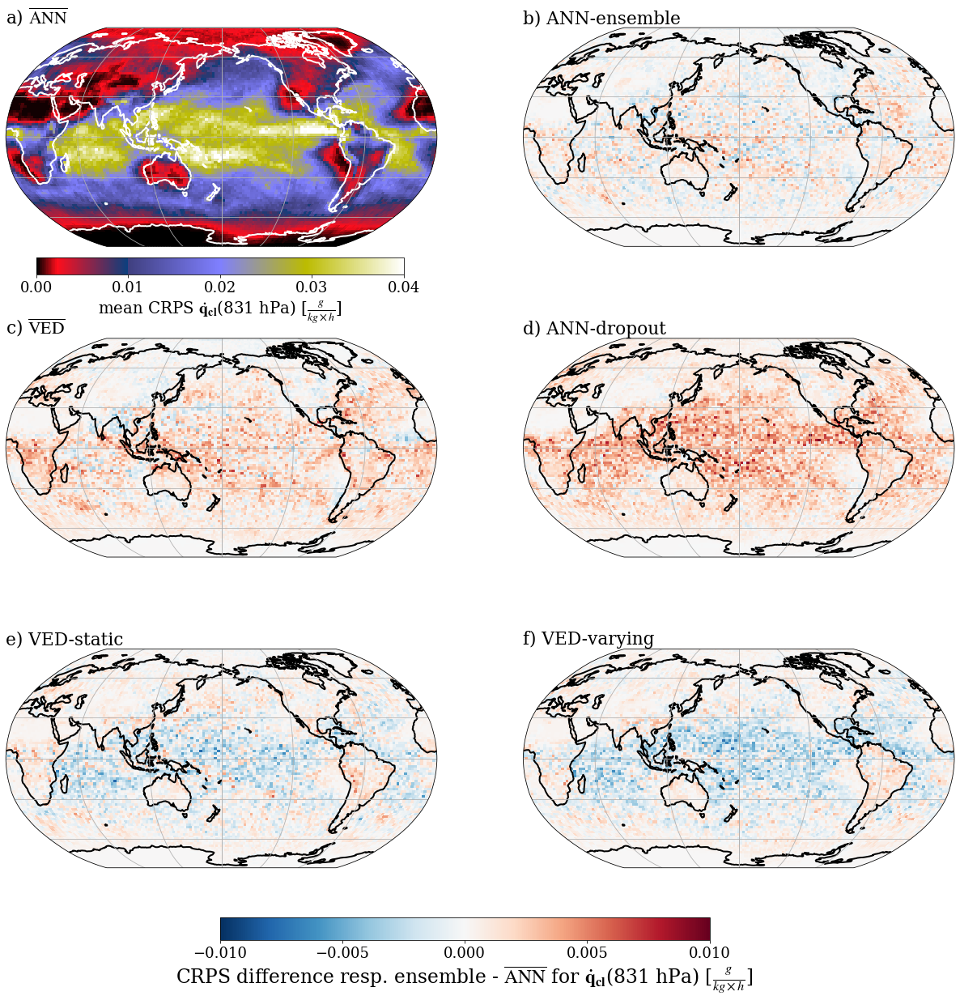

In [68]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,20))

imag=ax[0][0].pcolormesh(lon,lat,np.reshape(deter_7_ANN_lin_CLDLIQBC_831_mean,(lat.size,lon.size)),
                                cmap=seism_CLDLIQ, vmin=vmin_1,vmax=vmax_1, 
                                transform=ccrs.PlateCarree())
ax[0][0].coastlines(color='white',linewidth=2)
ax[0][0].gridlines()
ax[0][0].set_title(r'a) $\overline{\mathrm{ANN}}$',loc='left')
cbar_ax=fig.add_axes([0.15, 0.651, 0.30, 0.015])
cb=plt.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{q}_{cl}}$(831 hPa) [$\frac{g}{kg \times h}$]",cax=cbar_ax,ticks=np.arange(0,0.042,10E-3),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{q}_{cl}}$(831 hPa) [$\frac{g}{kg \times h}$]",fontsize=fz*1.1)
             
imag_2=ax[0][1].pcolormesh(lon,lat,np.reshape(stoch_5_CRPS_CLDLIQBCTEND_831_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_liq, vmin=-0.01,vmax=0.01, 
                                transform=ccrs.PlateCarree())
ax[0][1].coastlines(color='black',linewidth=2)
ax[0][1].gridlines()
ax[0][1].set_title(r'b) ANN-ensemble',loc='left')
    
cbar_ax_2 = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=plt.colorbar(imag_2,cax=cbar_ax_2,ticks=np.arange(-10E-3,10.1E-3,5E-3),orientation='horizontal')
cb.set_label(label=r"CRPS difference resp. ensemble - $\overline{\mathrm{ANN}}$ for $\mathbf{\dot{q}_{cl}}$(831 hPa) [$\frac{g}{kg \times h}$]",fontsize=fz*1.3)    


ax[1][0].pcolormesh(lon,lat,np.reshape(deter_VED_6_CRPS_CLDLIQBCTEND_831_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_liq, vmin=-0.01,vmax=0.01,
                                transform=ccrs.PlateCarree())
ax[1][0].coastlines(color='black',linewidth=2)
ax[1][0].gridlines()
ax[1][0].set_title(r'c) $\overline{\mathrm{VED}}$',loc='left')



ax[1][1].pcolormesh(lon,lat,np.reshape(ANN_dropout_CRPS_CLDLIQBCTEND_831_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_liq, vmin=-0.01,vmax=0.01,
                                transform=ccrs.PlateCarree())
ax[1][1].coastlines(color='black',linewidth=2)
ax[1][1].gridlines()
ax[1][1].set_title(r'd) ANN-dropout',loc='left')

ax[2][0].pcolormesh(lon,lat,np.reshape(static_VED_CRPS_CLDLIQBCTEND_831_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_liq, vmin=-0.01,vmax=0.01, 
                                transform=ccrs.PlateCarree())
ax[2][0].coastlines(color='black',linewidth=2)
ax[2][0].gridlines()
ax[2][0].set_title(r'e) VED-static',loc='left')


ax[2][1].pcolormesh(lon,lat,np.reshape(varying_VED_CRPS_CLDLIQBCTEND_831_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_liq, vmin=-0.01,vmax=0.01,
                                transform=ccrs.PlateCarree())
ax[2][1].coastlines(color='black',linewidth=2)
ax[2][1].gridlines()
ax[2][1].set_title(r'f) VED-varying',loc='left')



Text(0.0, 1.0, 'f) VED-varying')

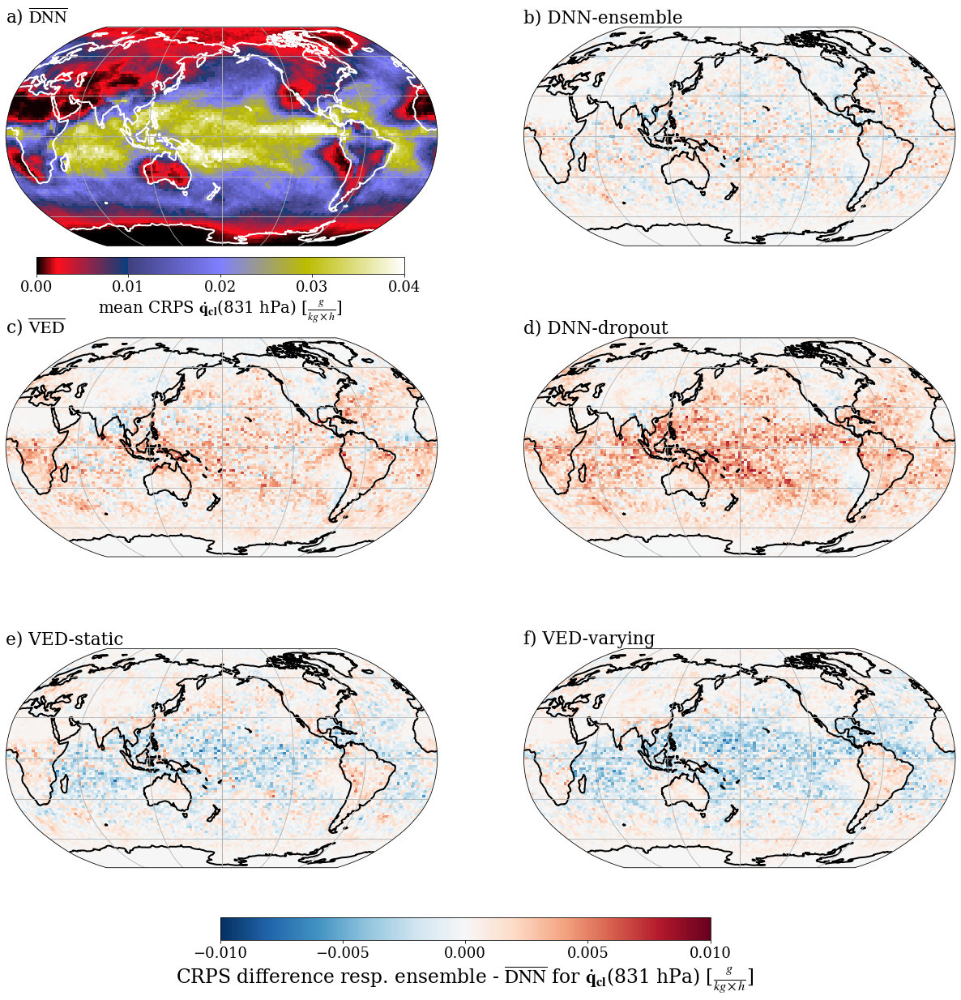

In [53]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,20))

imag=ax[0][0].pcolormesh(lon,lat,np.reshape(deter_7_ANN_lin_CLDLIQBC_831_mean,(lat.size,lon.size)),
                                cmap=seism_CLDLIQ, vmin=vmin_1,vmax=vmax_1, 
                                transform=ccrs.PlateCarree())
ax[0][0].coastlines(color='white',linewidth=2)
ax[0][0].gridlines()
ax[0][0].set_title(r'a) $\overline{\mathrm{DNN}}$',loc='left')
cbar_ax=fig.add_axes([0.15, 0.651, 0.30, 0.015])
cb=plt.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{q}_{cl}}$(831 hPa) [$\frac{g}{kg \times h}$]",cax=cbar_ax,ticks=np.arange(0,0.042,10E-3),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{q}_{cl}}$(831 hPa) [$\frac{g}{kg \times h}$]",fontsize=fz*1.1)
             
imag_2=ax[0][1].pcolormesh(lon,lat,np.reshape(stoch_5_CRPS_CLDLIQBCTEND_831_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_liq, vmin=-0.01,vmax=0.01, 
                                transform=ccrs.PlateCarree())
ax[0][1].coastlines(color='black',linewidth=2)
ax[0][1].gridlines()
ax[0][1].set_title(r'b) DNN-ensemble',loc='left')
    
cbar_ax_2 = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=plt.colorbar(imag_2,cax=cbar_ax_2,ticks=np.arange(-10E-3,10.1E-3,5E-3),orientation='horizontal')
cb.set_label(label=r"CRPS difference resp. ensemble - $\overline{\mathrm{DNN}}$ for $\mathbf{\dot{q}_{cl}}$(831 hPa) [$\frac{g}{kg \times h}$]",fontsize=fz*1.3)    


ax[1][0].pcolormesh(lon,lat,np.reshape(deter_VED_6_CRPS_CLDLIQBCTEND_831_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_liq, vmin=-0.01,vmax=0.01,
                                transform=ccrs.PlateCarree())
ax[1][0].coastlines(color='black',linewidth=2)
ax[1][0].gridlines()
ax[1][0].set_title(r'c) $\overline{\mathrm{VED}}$',loc='left')



ax[1][1].pcolormesh(lon,lat,np.reshape(ANN_dropout_CRPS_CLDLIQBCTEND_831_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_liq, vmin=-0.01,vmax=0.01,
                                transform=ccrs.PlateCarree())
ax[1][1].coastlines(color='black',linewidth=2)
ax[1][1].gridlines()
ax[1][1].set_title(r'd) DNN-dropout',loc='left')

ax[2][0].pcolormesh(lon,lat,np.reshape(static_VED_CRPS_CLDLIQBCTEND_831_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_liq, vmin=-0.01,vmax=0.01, 
                                transform=ccrs.PlateCarree())
ax[2][0].coastlines(color='black',linewidth=2)
ax[2][0].gridlines()
ax[2][0].set_title(r'e) VED-static',loc='left')


ax[2][1].pcolormesh(lon,lat,np.reshape(varying_VED_CRPS_CLDLIQBCTEND_831_diff,(lat.size,lon.size)),
                                cmap=seims_diff_cloud_liq, vmin=-0.01,vmax=0.01,
                                transform=ccrs.PlateCarree())
ax[2][1].coastlines(color='black',linewidth=2)
ax[2][1].gridlines()
ax[2][1].set_title(r'f) VED-varying',loc='left')



# mean CRPS for surface $\dot{q}$ 

In [54]:
vmin_2=0.0; vmax_2=0.25

In [55]:
seism_QBC,norm_seism=color_map_personalizer(20,vmin_2,vmax_2)

0
0
1
1
0
1


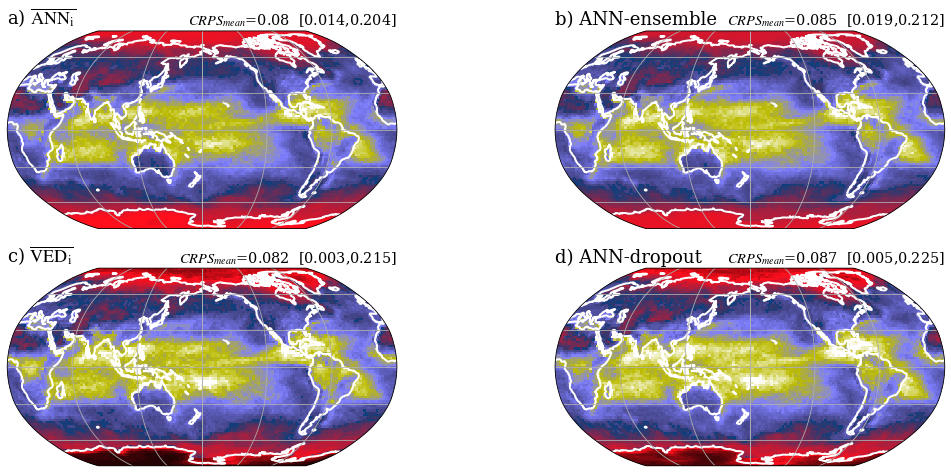

In [65]:
fig, ax = plt.subplots(2,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(18,8))

for isub in range(0,2): # Loop over 4 subplots
    #print(isub)
    isub0 = isub-2*math.floor(isub/2) # Determine location of subplot (out of 4)
    print(isub0)
    for iax in range(2): 
        
        if iax==0: 
            
            if isub0==0: 
                data = np.reshape(deter_7_ANN_lin_QBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'a) $\overline{\mathrm{ANN_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_7_ANN_lin_QBCTENDsurf_mean)
                                                                ,3))+'  ['+str(np.round(np.percentile(deter_7_ANN_lin_QBCTENDsurf_mean
                                                                                                      ,2.5),3))+','+str(np.round(np.percentile(deter_7_ANN_lin_QBCTENDsurf_mean,97.5),3))+']';

            if isub0==1:
                data = np.reshape(stoch_5_ANN_lin_QBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'b) ANN-ensemble';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(stoch_5_ANN_lin_QBCTENDsurf_mean)
                                                                ,3))+'  ['+str(np.round(np.percentile(stoch_5_ANN_lin_QBCTENDsurf_mean,
                                                                                                      2.5),3))+','+str(np.round(np.percentile(stoch_5_ANN_lin_QBCTENDsurf_mean,97.5),3))+']';


                
        if iax==1: 
            
            if isub0==0:
                data = np.reshape(deter_6_VED_QBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'c) $\overline{\mathrm{VED_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_6_VED_QBCTENDsurf_mean)
                                                                ,3))+'  ['+str(np.round(np.percentile(deter_6_VED_QBCTENDsurf_mean,
                                                                                                      2.5),3))+','+str(np.round(np.percentile(deter_6_VED_QBCTENDsurf_mean,97.5),3))+']';


                
            if isub0==1:
                data = np.reshape(ANN_1_lin_dr_0_1_QBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'd) ANN-dropout';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(ANN_1_lin_dr_0_1_QBCTENDsurf_mean)
                                                                ,3))+'  ['+str(np.round(np.percentile(ANN_1_lin_dr_0_1_QBCTENDsurf_mean
                                                                                                      ,2.5),3))+','+str(np.round(np.percentile(ANN_1_lin_dr_0_1_QBCTENDsurf_mean
                                                                                                                                               ,97.5),3))+']';

                
        iax7 = iax+2*math.floor(isub/2) # To make 6 panels 
        print(iax7)
        imag = ax[iax7][isub0].pcolormesh(lon, lat, data,
                                cmap=seism_QBC, vmin=vmin_2,vmax=vmax_2, 
                                transform=ccrs.PlateCarree())
        ax[iax7][isub].coastlines(color='white',linewidth=2)
        ax[iax7][isub].gridlines()
        ax[iax7][isub].set_title(tit,loc='left',fontsize=fz)
        ax[iax7][isub].set_title(tit_2,loc='right',fontsize=fz*0.8)

             
            
        # Colorbar
        #if isub==1 and iax==1:
        #    cbar_ax = fig.add_axes([0.35, 0.01, 0.30, 0.05])
        #    cb=fig.colorbar(imag, label="CRPS mean CLDICEBCTEND 288 hPa", cax=cbar_ax,ticks=np.arange(0,0.0252,5E-3),orientation='horizontal')
            

0
0 0
1 0
1
0 1
1 1


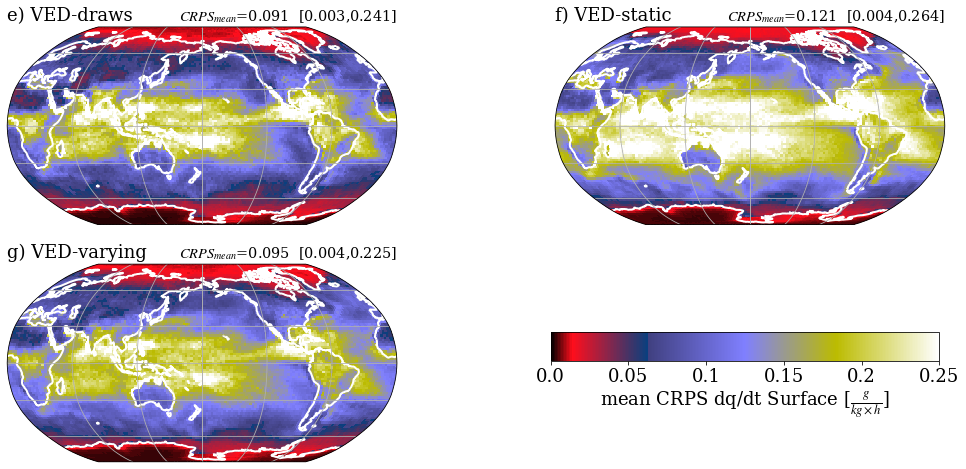

In [66]:
fig, ax = plt.subplots(2,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(18,8))

for isub in range(0,2): # Loop over 4 subplots
    #print(isub)
    isub0 = isub-2*math.floor(isub/2) # Determine location of subplot (out of 4)
    print(isub0)
    for iax in range(2): 
        
        if iax==0: 
            
            if isub0==0: 
                data = np.reshape(VED_1_0_0_7_QBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'e) VED-draws';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_0_0_7_QBCTENDsurf_mean)
                                                                ,3))+'  ['+str(np.round(np.percentile(VED_1_0_0_7_QBCTENDsurf_mean
                                                                                                      ,2.5),3))+','+str(np.round(np.percentile(VED_1_0_0_7_QBCTENDsurf_mean,97.5),3))+']';

            if isub0==1:
                data = np.reshape(VED_1_0_5_7_QBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'f) VED-static';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_0_5_7_QBCTENDsurf_mean)
                                                                ,3))+'  ['+str(np.round(np.percentile(VED_1_0_5_7_QBCTENDsurf_mean,
                                                                                                      2.5),3))+','+str(np.round(np.percentile(VED_1_0_5_7_QBCTENDsurf_mean,97.5),3))+']';


                
        if iax==1: 
            
            if isub0==0:
                data = np.reshape(VED_1_alpha_arr_1_7_QBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'g) VED-varying';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_alpha_arr_1_7_QBCTENDsurf_mean)
                                                                ,3))+'  ['+str(np.round(np.percentile(VED_1_alpha_arr_1_7_QBCTENDsurf_mean,
                                                                                                      2.5),3))+','+str(np.round(np.percentile(VED_1_alpha_arr_1_7_QBCTENDsurf_mean,97.5),3))+']';


                
            #if isub0==1:
            #    data = np.reshape(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean,(lat.size,lon.size));
            #    tit = r'h) VED $\alpha$ array';
            #     tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean)
           #                                                     ,4))+'  ['+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean
            #                                                                                          ,2.5),4))+','+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean
            #                                                                                                                                   ,97.5),4))+']';

                
        
             
            
                      
        iax7 = iax+2*math.floor(isub/2) # To make 6 panels 
        print(iax7,isub)
        
        imag = ax[iax7][isub0].pcolormesh(lon, lat, data,
                                cmap=seism_QBC, vmin=vmin_2,vmax=vmax_2, 
                                transform=ccrs.PlateCarree())
        ax[iax7][isub].coastlines(color='white',linewidth=2)
        ax[iax7][isub].gridlines()
        ax[iax7][isub].set_title(tit,loc='left',fontsize=fz)
        ax[iax7][isub].set_title(tit_2,loc='right',fontsize=fz*0.8)

            
        # Colorbar
        #if isub==1 and iax==1:
cbar_ax = fig.add_axes([0.57, 0.3, 0.30, 0.05])
cb=fig.colorbar(imag, label=r"mean CRPS dq/dt Surface [$\frac{g}{kg \times h}$]", cax=cbar_ax,ticks=np.arange(0,0.251,5E-2),orientation='horizontal')

fig.delaxes(ax[1][1])   
cb.set_ticklabels(np.round(np.arange(0,0.251,5E-2),2),fontsize=fz)
cb.set_label(label=r"mean CRPS dq/dt Surface [$\frac{g}{kg \times h}$]",fontsize=fz)

            

0
0
1
2
1
0
1
2


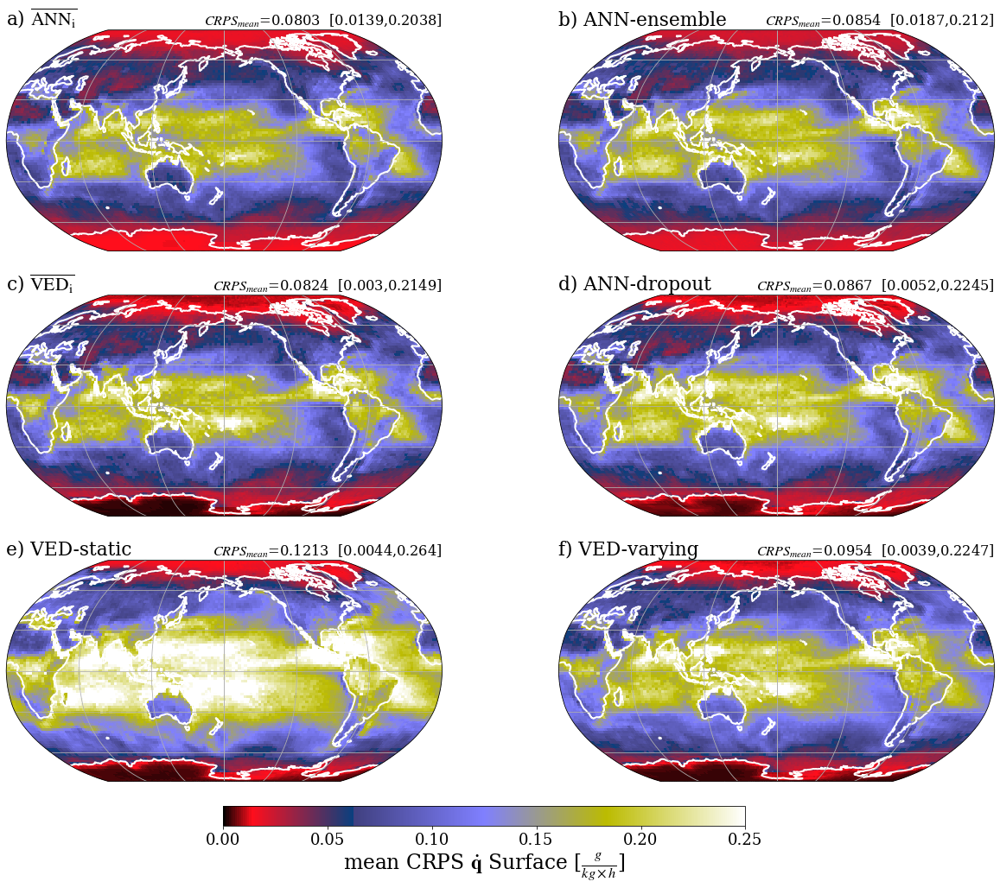

In [81]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,16))

for isub in range(0,2): # Loop over 4 subplots
    #print(isub)
    isub0 = isub-2*math.floor(isub/2) # Determine location of subplot (out of 4)
    print(isub0)
    for iax in range(3): 
        
        if iax==0: 
            
            if isub0==0: 
                data = np.reshape(deter_7_ANN_lin_QBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'a) $\overline{\mathrm{ANN_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_7_ANN_lin_QBCTENDsurf_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(deter_7_ANN_lin_QBCTENDsurf_mean
                                                                                                      ,2.5),4))+','+str(np.round(np.percentile(deter_7_ANN_lin_QBCTENDsurf_mean,97.5),4))+']';

            if isub0==1:
                data = np.reshape(stoch_5_ANN_lin_QBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'b) ANN-ensemble';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(stoch_5_ANN_lin_QBCTENDsurf_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(stoch_5_ANN_lin_QBCTENDsurf_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(stoch_5_ANN_lin_QBCTENDsurf_mean,97.5),4))+']';


                
        if iax==1: 
            
            if isub0==0:
                data = np.reshape(deter_6_VED_QBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'c) $\overline{\mathrm{VED_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_6_VED_QBCTENDsurf_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(deter_6_VED_QBCTENDsurf_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(deter_6_VED_QBCTENDsurf_mean,97.5),4))+']';


                
            if isub0==1:
                data = np.reshape(ANN_1_lin_dr_0_1_QBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'd) ANN-dropout';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(ANN_1_lin_dr_0_1_QBCTENDsurf_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(ANN_1_lin_dr_0_1_QBCTENDsurf_mean
                                                                                                      ,2.5),4))+','+str(np.round(np.percentile(ANN_1_lin_dr_0_1_QBCTENDsurf_mean
                                                                                                                                               ,97.5),4))+']';
            

        if iax==2:
            
        
            if isub0==0:
                data = np.reshape(VED_1_0_5_7_QBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'e) VED-static';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_0_5_7_QBCTENDsurf_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(VED_1_0_5_7_QBCTENDsurf_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(VED_1_0_5_7_QBCTENDsurf_mean,97.5),4))+']';
            
            if isub0==1:
                data = np.reshape(VED_1_alpha_arr_1_7_QBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'f) VED-varying';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_alpha_arr_1_7_QBCTENDsurf_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(VED_1_alpha_arr_1_7_QBCTENDsurf_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(VED_1_alpha_arr_1_7_QBCTENDsurf_mean,97.5),4))+']';


        
        
        
        
        
        
        
        iax7 = iax+2*math.floor(isub/2) # To make 6 panels 
        print(iax7)
        imag = ax[iax7][isub0].pcolormesh(lon, lat, data,
                                cmap=seism_QBC, vmin=vmin_2,vmax=vmax_2, 
                                transform=ccrs.PlateCarree())
        ax[iax7][isub].coastlines(color='white',linewidth=2)
        ax[iax7][isub].gridlines()
        ax[iax7][isub].set_title(tit,loc='left')
        ax[iax7][isub].set_title(tit_2,loc='right',fontsize=fz*0.9)

cbar_ax = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=fig.colorbar(imag, cax=cbar_ax,ticks=np.arange(0,0.251,5E-2),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{q}}$ Surface [$\frac{g}{kg \times h}$]",fontsize=fz*1.3)
             
       

In [56]:
#compute skill scores and differences for surface \dot{q}

stoch_5_CRPS_QBCTEND_skill_score=1-(stoch_5_ANN_lin_QBCTENDsurf_mean/deter_7_ANN_lin_QBCTENDsurf_mean)

deter_VED_6_CRPS_QBCTEND_skill_score=1-(deter_6_VED_QBCTENDsurf_mean/deter_7_ANN_lin_QBCTENDsurf_mean)

ANN_dropout_CRPS_QBCTEND_skill_score=1-(ANN_1_lin_dr_0_1_QBCTENDsurf_mean/deter_7_ANN_lin_QBCTENDsurf_mean)

static_VED_CRPS_QBCTEND_skill_score=1-(VED_1_0_5_7_QBCTENDsurf_mean/deter_7_ANN_lin_QBCTENDsurf_mean)

varying_VED_CRPS_QBCTEND_skill_score=1-(VED_1_alpha_arr_1_7_QBCTENDsurf_mean/deter_7_ANN_lin_QBCTENDsurf_mean)

stoch_5_CRPS_QBCTEND_diff=stoch_5_ANN_lin_QBCTENDsurf_mean-deter_7_ANN_lin_QBCTENDsurf_mean

deter_VED_6_CRPS_QBCTEND_diff=deter_6_VED_QBCTENDsurf_mean-deter_7_ANN_lin_QBCTENDsurf_mean

ANN_dropout_CRPS_QBCTEND_diff=ANN_1_lin_dr_0_1_QBCTENDsurf_mean-deter_7_ANN_lin_QBCTENDsurf_mean

static_VED_CRPS_QBCTEND_diff=VED_1_0_5_7_QBCTENDsurf_mean-deter_7_ANN_lin_QBCTENDsurf_mean

varying_VED_CRPS_QBCTEND_diff=VED_1_alpha_arr_1_7_QBCTENDsurf_mean-deter_7_ANN_lin_QBCTENDsurf_mean

In [57]:
seims_diff_q,norm_diff_q=color_map_personalizer_diff(20,-0.1,0.1)

Text(0.0, 1.0, 'f) VED-varying')

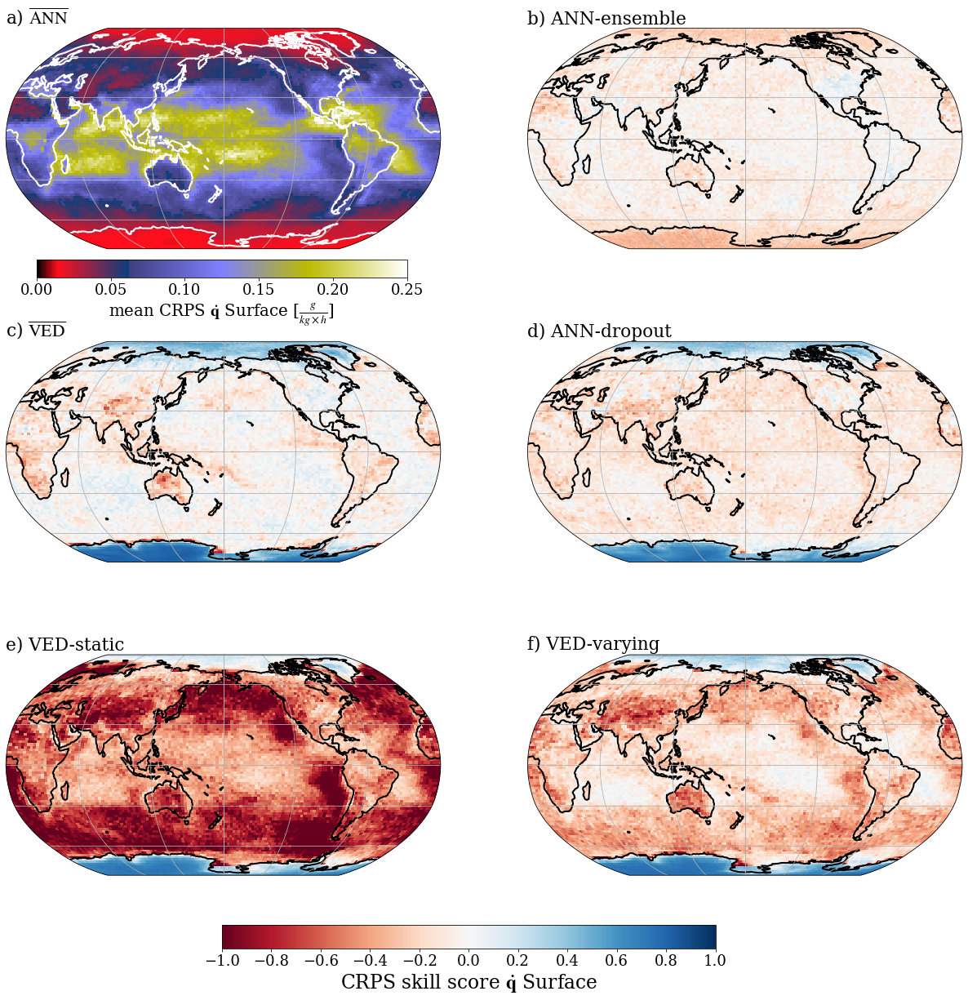

In [59]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,20))

imag=ax[0][0].pcolormesh(lon,lat,np.reshape(deter_7_ANN_lin_QBCTENDsurf_mean,(lat.size,lon.size)),
                                cmap=seism_QBC, vmin=vmin_2,vmax=vmax_2, 
                                transform=ccrs.PlateCarree())
ax[0][0].coastlines(color='white',linewidth=2)
ax[0][0].gridlines()
ax[0][0].set_title(r'a) $\overline{\mathrm{ANN}}$',loc='left')
cbar_ax=fig.add_axes([0.15, 0.651, 0.30, 0.015])
cb=plt.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{q}}$ Surface [$\frac{g}{kg \times h}$]",cax=cbar_ax,ticks=np.arange(0,0.28,5E-2),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{q}}$ Surface [$\frac{g}{kg \times h}$]",fontsize=fz*1.1)
             
imag_2=ax[0][1].pcolormesh(lon,lat,np.reshape(stoch_5_CRPS_QBCTEND_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[0][1].coastlines(color='black',linewidth=2)
ax[0][1].gridlines()
ax[0][1].set_title(r'b) ANN-ensemble',loc='left')
    
cbar_ax_2 = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=plt.colorbar(imag_2,cax=cbar_ax_2,ticks=np.arange(-1,1.022,2E-1),orientation='horizontal')
cb.set_label(label=r"CRPS skill score $\mathbf{\dot{q}}$ Surface",fontsize=fz*1.3)    


ax[1][0].pcolormesh(lon,lat,np.reshape(deter_VED_6_CRPS_QBCTEND_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[1][0].coastlines(color='black',linewidth=2)
ax[1][0].gridlines()
ax[1][0].set_title(r'c) $\overline{\mathrm{VED}}$',loc='left')



ax[1][1].pcolormesh(lon,lat,np.reshape(ANN_dropout_CRPS_QBCTEND_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[1][1].coastlines(color='black',linewidth=2)
ax[1][1].gridlines()
ax[1][1].set_title(r'd) ANN-dropout',loc='left')

ax[2][0].pcolormesh(lon,lat,np.reshape(static_VED_CRPS_QBCTEND_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[2][0].coastlines(color='black',linewidth=2)
ax[2][0].gridlines()
ax[2][0].set_title(r'e) VED-static',loc='left')


ax[2][1].pcolormesh(lon,lat,np.reshape(varying_VED_CRPS_QBCTEND_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[2][1].coastlines(color='black',linewidth=2)
ax[2][1].gridlines()
ax[2][1].set_title(r'f) VED-varying',loc='left')



Text(0.0, 1.0, 'f) VED-varying')

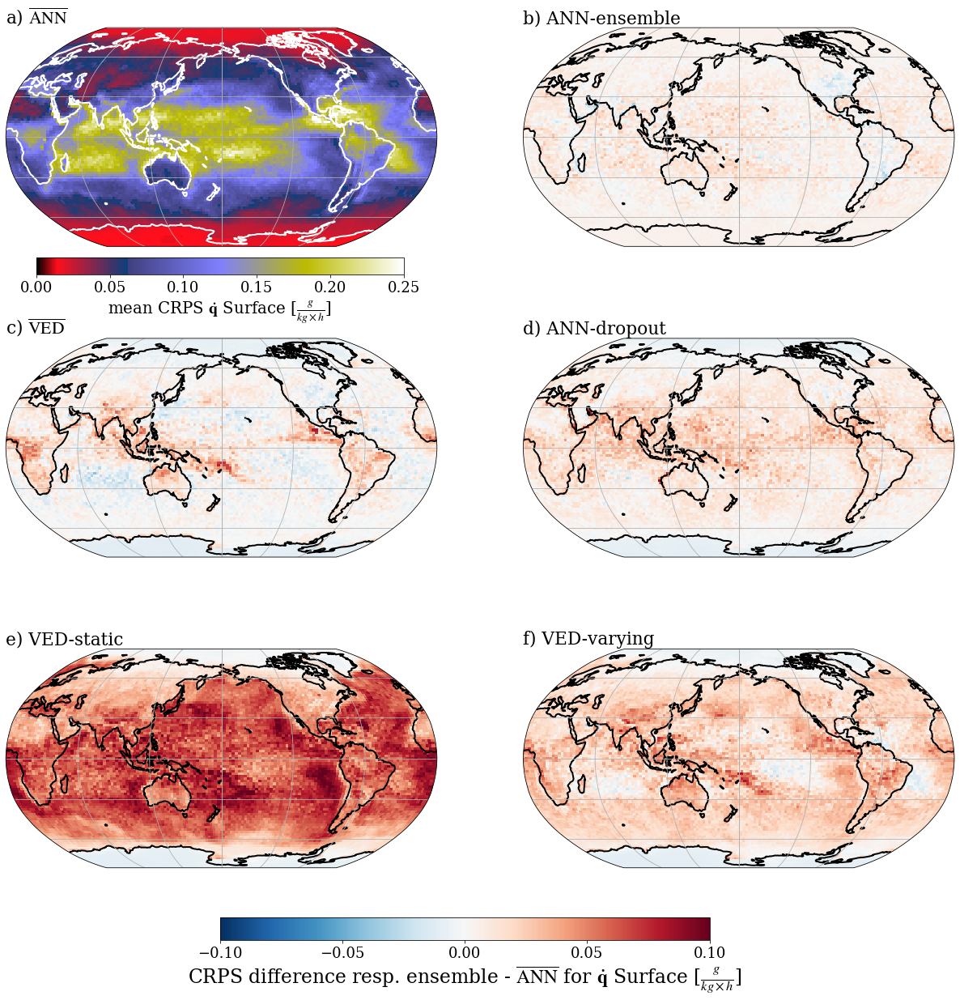

In [60]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,20))

imag=ax[0][0].pcolormesh(lon,lat,np.reshape(deter_7_ANN_lin_QBCTENDsurf_mean,(lat.size,lon.size)),
                                cmap=seism_QBC, vmin=vmin_2,vmax=vmax_2, 
                                transform=ccrs.PlateCarree())
ax[0][0].coastlines(color='white',linewidth=2)
ax[0][0].gridlines()
ax[0][0].set_title(r'a) $\overline{\mathrm{ANN}}$',loc='left')
cbar_ax=fig.add_axes([0.15, 0.651, 0.30, 0.015])
cb=plt.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{q}}$ Surface [$\frac{g}{kg \times h}$]",cax=cbar_ax,ticks=np.arange(0,0.28,5E-2),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{q}}$ Surface [$\frac{g}{kg \times h}$]",fontsize=fz*1.1)
             
imag_2=ax[0][1].pcolormesh(lon,lat,np.reshape(stoch_5_CRPS_QBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_q, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[0][1].coastlines(color='black',linewidth=2)
ax[0][1].gridlines()
ax[0][1].set_title(r'b) ANN-ensemble',loc='left')
    
cbar_ax_2 = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=plt.colorbar(imag_2,cax=cbar_ax_2,ticks=np.arange(-0.1,0.102,5E-2),orientation='horizontal')
cb.set_label(label=r"CRPS difference resp. ensemble - $\overline{\mathrm{ANN}}$ for $\mathbf{\dot{q}}$ Surface [$\frac{g}{kg \times h}$]",fontsize=fz*1.3)    


ax[1][0].pcolormesh(lon,lat,np.reshape(deter_VED_6_CRPS_QBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_q, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[1][0].coastlines(color='black',linewidth=2)
ax[1][0].gridlines()
ax[1][0].set_title(r'c) $\overline{\mathrm{VED}}$',loc='left')



ax[1][1].pcolormesh(lon,lat,np.reshape(ANN_dropout_CRPS_QBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_q, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[1][1].coastlines(color='black',linewidth=2)
ax[1][1].gridlines()
ax[1][1].set_title(r'd) ANN-dropout',loc='left')

ax[2][0].pcolormesh(lon,lat,np.reshape(static_VED_CRPS_QBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_q, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[2][0].coastlines(color='black',linewidth=2)
ax[2][0].gridlines()
ax[2][0].set_title(r'e) VED-static',loc='left')


ax[2][1].pcolormesh(lon,lat,np.reshape(varying_VED_CRPS_QBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_q, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[2][1].coastlines(color='black',linewidth=2)
ax[2][1].gridlines()
ax[2][1].set_title(r'f) VED-varying',loc='left')



Text(0.0, 1.0, 'f) VED-varying')

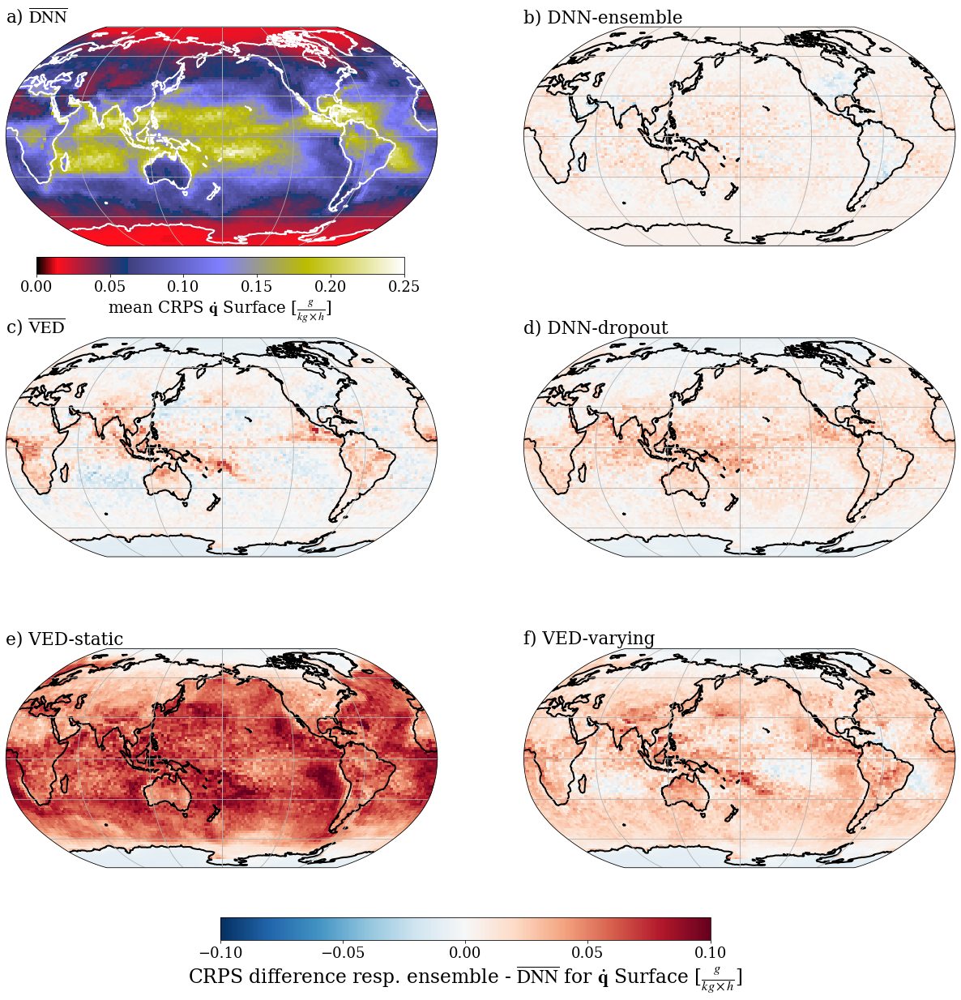

In [58]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,20))

imag=ax[0][0].pcolormesh(lon,lat,np.reshape(deter_7_ANN_lin_QBCTENDsurf_mean,(lat.size,lon.size)),
                                cmap=seism_QBC, vmin=vmin_2,vmax=vmax_2, 
                                transform=ccrs.PlateCarree())
ax[0][0].coastlines(color='white',linewidth=2)
ax[0][0].gridlines()
ax[0][0].set_title(r'a) $\overline{\mathrm{DNN}}$',loc='left')
cbar_ax=fig.add_axes([0.15, 0.651, 0.30, 0.015])
cb=plt.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{q}}$ Surface [$\frac{g}{kg \times h}$]",cax=cbar_ax,ticks=np.arange(0,0.28,5E-2),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{q}}$ Surface [$\frac{g}{kg \times h}$]",fontsize=fz*1.1)
             
imag_2=ax[0][1].pcolormesh(lon,lat,np.reshape(stoch_5_CRPS_QBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_q, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[0][1].coastlines(color='black',linewidth=2)
ax[0][1].gridlines()
ax[0][1].set_title(r'b) DNN-ensemble',loc='left')
    
cbar_ax_2 = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=plt.colorbar(imag_2,cax=cbar_ax_2,ticks=np.arange(-0.1,0.102,5E-2),orientation='horizontal')
cb.set_label(label=r"CRPS difference resp. ensemble - $\overline{\mathrm{DNN}}$ for $\mathbf{\dot{q}}$ Surface [$\frac{g}{kg \times h}$]",fontsize=fz*1.3)    


ax[1][0].pcolormesh(lon,lat,np.reshape(deter_VED_6_CRPS_QBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_q, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[1][0].coastlines(color='black',linewidth=2)
ax[1][0].gridlines()
ax[1][0].set_title(r'c) $\overline{\mathrm{VED}}$',loc='left')



ax[1][1].pcolormesh(lon,lat,np.reshape(ANN_dropout_CRPS_QBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_q, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[1][1].coastlines(color='black',linewidth=2)
ax[1][1].gridlines()
ax[1][1].set_title(r'd) DNN-dropout',loc='left')

ax[2][0].pcolormesh(lon,lat,np.reshape(static_VED_CRPS_QBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_q, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[2][0].coastlines(color='black',linewidth=2)
ax[2][0].gridlines()
ax[2][0].set_title(r'e) VED-static',loc='left')


ax[2][1].pcolormesh(lon,lat,np.reshape(varying_VED_CRPS_QBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_q, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[2][1].coastlines(color='black',linewidth=2)
ax[2][1].gridlines()
ax[2][1].set_title(r'f) VED-varying',loc='left')



# mean CRPS of surface $\dot{T}$

In [62]:
vmin_3=0.0; vmax_3=0.25

seism_TBC,norm_seism=color_map_personalizer(20,vmin_3,vmax_3)

0
0
1
1
0
1


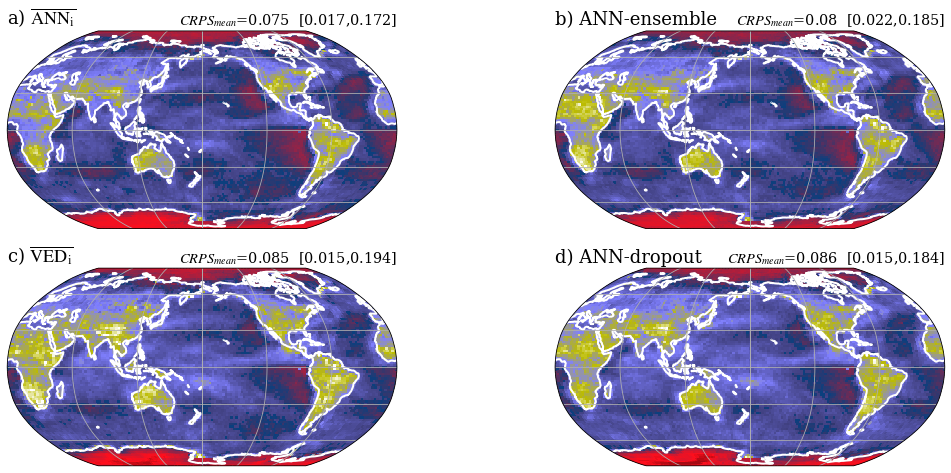

In [71]:
fig, ax = plt.subplots(2,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(18,8))

for isub in range(0,2): # Loop over 4 subplots
    #print(isub)
    isub0 = isub-2*math.floor(isub/2) # Determine location of subplot (out of 4)
    print(isub0)
    for iax in range(2): 
        
        if iax==0: 
            
            if isub0==0: 
                data = np.reshape(deter_7_ANN_lin_TBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'a) $\overline{\mathrm{ANN_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_7_ANN_lin_TBCTENDsurf_mean)
                                                                ,3))+'  ['+str(np.round(np.percentile(deter_7_ANN_lin_TBCTENDsurf_mean
                                                                                                      ,2.5),3))+','+str(np.round(np.percentile(deter_7_ANN_lin_TBCTENDsurf_mean,97.5),3))+']';

            if isub0==1:
                data = np.reshape(stoch_5_ANN_lin_TBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'b) ANN-ensemble';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(stoch_5_ANN_lin_TBCTENDsurf_mean)
                                                                ,3))+'  ['+str(np.round(np.percentile(stoch_5_ANN_lin_TBCTENDsurf_mean,
                                                                                                      2.5),3))+','+str(np.round(np.percentile(stoch_5_ANN_lin_TBCTENDsurf_mean,97.5),3))+']';


                
        if iax==1: 
            
            if isub0==0:
                data = np.reshape(deter_6_VED_TBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'c) $\overline{\mathrm{VED_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_6_VED_TBCTENDsurf_mean)
                                                                ,3))+'  ['+str(np.round(np.percentile(deter_6_VED_TBCTENDsurf_mean,
                                                                                                      2.5),3))+','+str(np.round(np.percentile(deter_6_VED_TBCTENDsurf_mean,97.5),3))+']';


                
            if isub0==1:
                data = np.reshape(ANN_1_lin_dr_0_1_TBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'd) ANN-dropout';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(ANN_1_lin_dr_0_1_TBCTENDsurf_mean)
                                                                ,3))+'  ['+str(np.round(np.percentile(ANN_1_lin_dr_0_1_TBCTENDsurf_mean
                                                                                                      ,2.5),3))+','+str(np.round(np.percentile(ANN_1_lin_dr_0_1_TBCTENDsurf_mean
                                                                                                                                               ,97.5),3))+']';

                
        iax7 = iax+2*math.floor(isub/2) # To make 6 panels 
        print(iax7)
        imag = ax[iax7][isub0].pcolormesh(lon, lat, data,
                                cmap=seism_TBC, vmin=vmin_3,vmax=vmax_3, 
                                transform=ccrs.PlateCarree())
        ax[iax7][isub].coastlines(color='white',linewidth=2)
        ax[iax7][isub].gridlines()
        ax[iax7][isub].set_title(tit,loc='left',fontsize=fz)
        ax[iax7][isub].set_title(tit_2,loc='right',fontsize=fz*0.8)

             
            
        # Colorbar
        #if isub==1 and iax==1:
        #    cbar_ax = fig.add_axes([0.35, 0.01, 0.30, 0.05])
        #    cb=fig.colorbar(imag, label="CRPS mean CLDICEBCTEND 288 hPa", cax=cbar_ax,ticks=np.arange(0,0.0252,5E-3),orientation='horizontal')
            

0
0 0
1 0
1
0 1
1 1


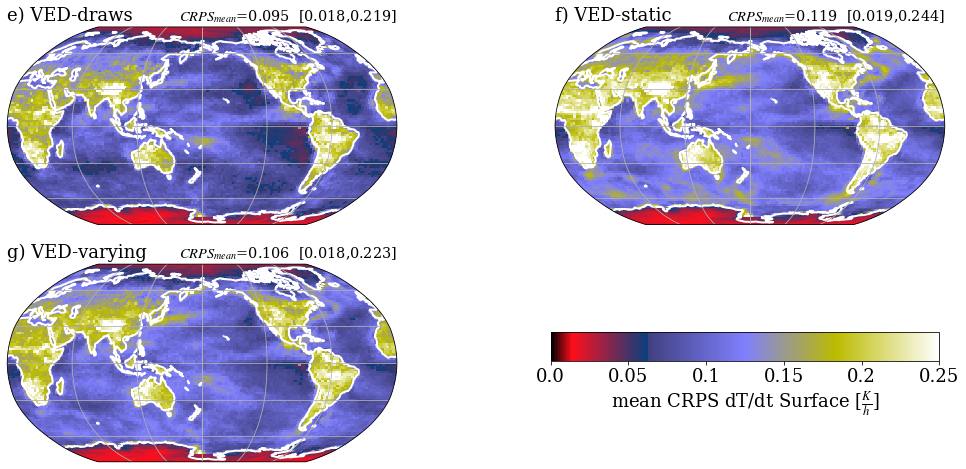

In [37]:
fig, ax = plt.subplots(2,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(18,8))

for isub in range(0,2): # Loop over 4 subplots
    #print(isub)
    isub0 = isub-2*math.floor(isub/2) # Determine location of subplot (out of 4)
    print(isub0)
    for iax in range(2): 
        
        if iax==0: 
            
            if isub0==0: 
                data = np.reshape(VED_1_0_0_7_TBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'e) VED-draws';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_0_0_7_TBCTENDsurf_mean)
                                                                ,3))+'  ['+str(np.round(np.percentile(VED_1_0_0_7_TBCTENDsurf_mean
                                                                                                      ,2.5),3))+','+str(np.round(np.percentile(VED_1_0_0_7_TBCTENDsurf_mean,97.5),3))+']';

            if isub0==1:
                data = np.reshape(VED_1_0_5_7_TBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'f) VED-static';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_0_5_7_TBCTENDsurf_mean)
                                                                ,3))+'  ['+str(np.round(np.percentile(VED_1_0_5_7_TBCTENDsurf_mean,
                                                                                                      2.5),3))+','+str(np.round(np.percentile(VED_1_0_5_7_TBCTENDsurf_mean,97.5),3))+']';


                
        if iax==1: 
            
            if isub0==0:
                data = np.reshape(VED_1_alpha_arr_1_7_TBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'g) VED-varying';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_alpha_arr_1_7_TBCTENDsurf_mean)
                                                                ,3))+'  ['+str(np.round(np.percentile(VED_1_alpha_arr_1_7_TBCTENDsurf_mean,
                                                                                                      2.5),3))+','+str(np.round(np.percentile(VED_1_alpha_arr_1_7_TBCTENDsurf_mean,97.5),3))+']';


                
            #if isub0==1:
            #    data = np.reshape(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean,(lat.size,lon.size));
            #    tit = r'h) VED $\alpha$ array';
            #     tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean)
           #                                                     ,4))+'  ['+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean
            #                                                                                          ,2.5),4))+','+str(np.round(np.percentile(VED_1_alpha_arr_1_7_CLDLIQBC_831_mean
            #                                                                                                                                   ,97.5),4))+']';

                
        
             
            
                      
        iax7 = iax+2*math.floor(isub/2) # To make 6 panels 
        print(iax7,isub)
        
        imag = ax[iax7][isub0].pcolormesh(lon, lat, data,
                                cmap=seism_TBC, vmin=vmin_3,vmax=vmax_3, 
                                transform=ccrs.PlateCarree())
        ax[iax7][isub].coastlines(color='white',linewidth=2)
        ax[iax7][isub].gridlines()
        ax[iax7][isub].set_title(tit,loc='left',fontsize=fz)
        ax[iax7][isub].set_title(tit_2,loc='right',fontsize=fz*0.8)

            
        # Colorbar
        #if isub==1 and iax==1:
cbar_ax = fig.add_axes([0.57, 0.3, 0.30, 0.05])
cb=fig.colorbar(imag, label=r"mean CRPS dT/dt Surface [$\frac{g}{h}$]", cax=cbar_ax,ticks=np.arange(0,0.42,5E-2),orientation='horizontal')

fig.delaxes(ax[1][1])   
cb.set_ticklabels(np.round(np.arange(0,0.42,5E-2),2),fontsize=fz)
cb.set_label(label=r"mean CRPS dT/dt Surface [$\frac{K}{h}$]",fontsize=fz)

            

0
0
1
2
1
0
1
2


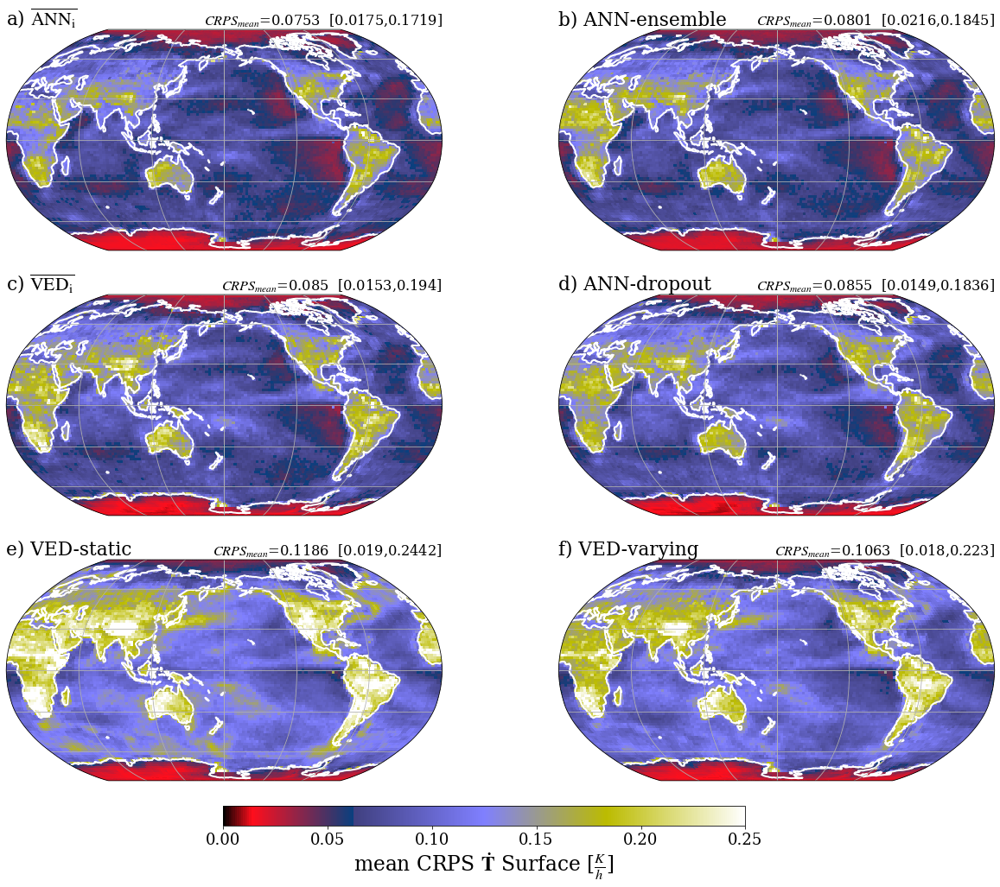

In [84]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,16))

for isub in range(0,2): # Loop over 4 subplots
    #print(isub)
    isub0 = isub-2*math.floor(isub/2) # Determine location of subplot (out of 4)
    print(isub0)
    for iax in range(3): 
        
        if iax==0: 
            
            if isub0==0: 
                data = np.reshape(deter_7_ANN_lin_TBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'a) $\overline{\mathrm{ANN_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_7_ANN_lin_TBCTENDsurf_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(deter_7_ANN_lin_TBCTENDsurf_mean
                                                                                                      ,2.5),4))+','+str(np.round(np.percentile(deter_7_ANN_lin_TBCTENDsurf_mean,97.5),4))+']';

            if isub0==1:
                data = np.reshape(stoch_5_ANN_lin_TBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'b) ANN-ensemble';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(stoch_5_ANN_lin_TBCTENDsurf_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(stoch_5_ANN_lin_TBCTENDsurf_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(stoch_5_ANN_lin_TBCTENDsurf_mean,97.5),4))+']';


                
        if iax==1: 
            
            if isub0==0:
                data = np.reshape(deter_6_VED_TBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'c) $\overline{\mathrm{VED_i}}$';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(deter_6_VED_TBCTENDsurf_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(deter_6_VED_TBCTENDsurf_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(deter_6_VED_TBCTENDsurf_mean,97.5),4))+']';


                
            if isub0==1:
                data = np.reshape(ANN_1_lin_dr_0_1_TBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'd) ANN-dropout';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(ANN_1_lin_dr_0_1_TBCTENDsurf_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(ANN_1_lin_dr_0_1_TBCTENDsurf_mean
                                                                                                      ,2.5),4))+','+str(np.round(np.percentile(ANN_1_lin_dr_0_1_TBCTENDsurf_mean
                                                                                                                                               ,97.5),4))+']';
            

        if iax==2:
            
        
            if isub0==0:
                data = np.reshape(VED_1_0_5_7_TBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'e) VED-static';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_0_5_7_TBCTENDsurf_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(VED_1_0_5_7_TBCTENDsurf_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(VED_1_0_5_7_TBCTENDsurf_mean,97.5),4))+']';
            
            if isub0==1:
                data = np.reshape(VED_1_alpha_arr_1_7_TBCTENDsurf_mean,(lat.size,lon.size));
                tit = r'f) VED-varying';
                tit_2=r'$CRPS_{mean}$='+ str(np.round(np.mean(VED_1_alpha_arr_1_7_TBCTENDsurf_mean)
                                                                ,4))+'  ['+str(np.round(np.percentile(VED_1_alpha_arr_1_7_TBCTENDsurf_mean,
                                                                                                      2.5),4))+','+str(np.round(np.percentile(VED_1_alpha_arr_1_7_TBCTENDsurf_mean,97.5),4))+']';


        
        
        
        
        
        
        
        iax7 = iax+2*math.floor(isub/2) # To make 6 panels 
        print(iax7)
        imag = ax[iax7][isub0].pcolormesh(lon, lat, data,
                                cmap=seism_QBC, vmin=vmin_2,vmax=vmax_2, 
                                transform=ccrs.PlateCarree())
        ax[iax7][isub].coastlines(color='white',linewidth=2)
        ax[iax7][isub].gridlines()
        ax[iax7][isub].set_title(tit,loc='left')
        ax[iax7][isub].set_title(tit_2,loc='right',fontsize=fz*0.9)

cbar_ax = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=fig.colorbar(imag, cax=cbar_ax,ticks=np.arange(0,0.251,5E-2),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{T}}$ Surface [$\frac{K}{h}$]",fontsize=fz*1.3)
             

In [60]:
# compute skill scores of CRPS for surface \dot{T}

stoch_5_CRPS_TBCTEND_skill_score=1-(stoch_5_ANN_lin_TBCTENDsurf_mean/deter_7_ANN_lin_TBCTENDsurf_mean)

deter_VED_6_CRPS_TBCTEND_skill_score=1-(deter_6_VED_TBCTENDsurf_mean/deter_7_ANN_lin_TBCTENDsurf_mean)

ANN_dropout_CRPS_TBCTEND_skill_score=1-(ANN_1_lin_dr_0_1_TBCTENDsurf_mean/deter_7_ANN_lin_TBCTENDsurf_mean)

static_VED_CRPS_TBCTEND_skill_score=1-(VED_1_0_5_7_TBCTENDsurf_mean/deter_7_ANN_lin_TBCTENDsurf_mean)

varying_VED_CRPS_TBCTEND_skill_score=1-(VED_1_alpha_arr_1_7_TBCTENDsurf_mean/deter_7_ANN_lin_TBCTENDsurf_mean)

stoch_5_CRPS_TBCTEND_diff=stoch_5_ANN_lin_TBCTENDsurf_mean-deter_7_ANN_lin_TBCTENDsurf_mean

deter_VED_6_CRPS_TBCTEND_diff=deter_6_VED_TBCTENDsurf_mean-deter_7_ANN_lin_TBCTENDsurf_mean

ANN_dropout_CRPS_TBCTEND_diff=ANN_1_lin_dr_0_1_TBCTENDsurf_mean-deter_7_ANN_lin_TBCTENDsurf_mean

static_VED_CRPS_TBCTEND_diff=VED_1_0_5_7_TBCTENDsurf_mean-deter_7_ANN_lin_TBCTENDsurf_mean

varying_VED_CRPS_TBCTEND_diff=VED_1_alpha_arr_1_7_TBCTENDsurf_mean-deter_7_ANN_lin_TBCTENDsurf_mean

In [63]:
seims_diff_T,norm_diff_T=color_map_personalizer_diff(20,-0.1,0.1)

Text(0.0, 1.0, 'f) VED-varying')

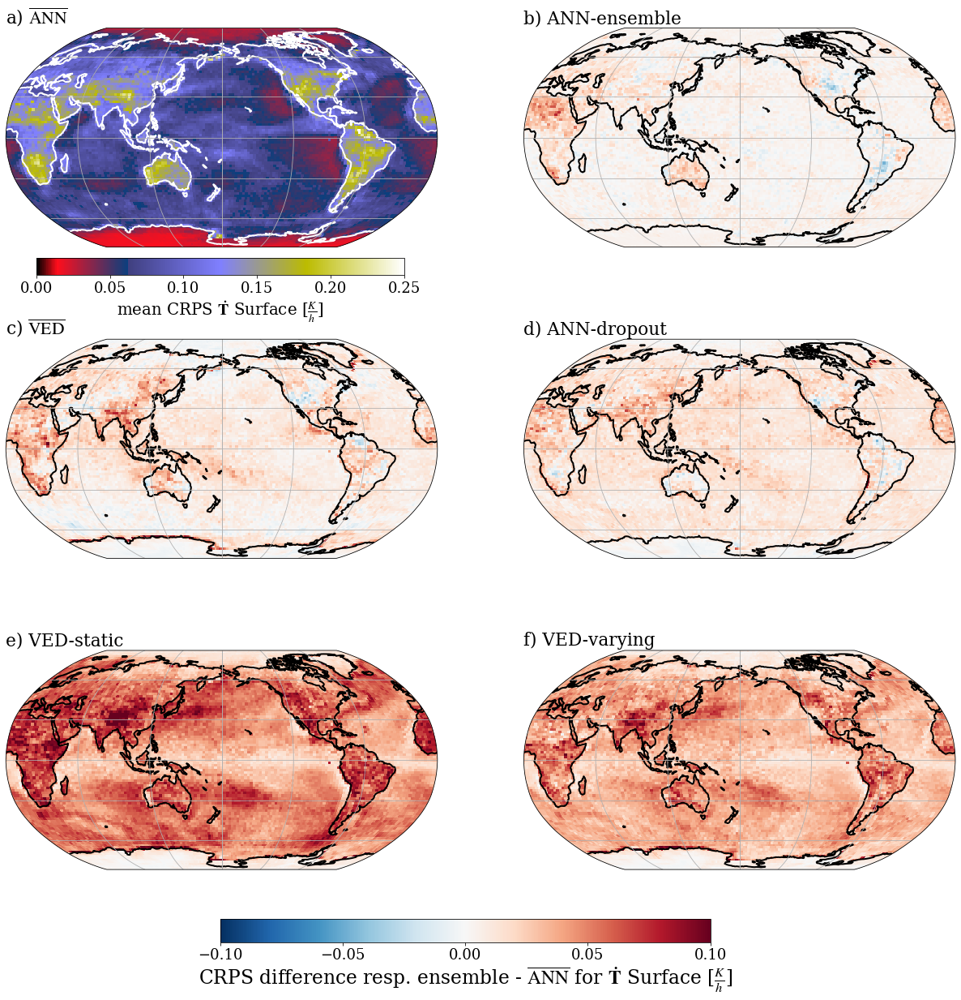

In [54]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,20))

imag=ax[0][0].pcolormesh(lon,lat,np.reshape(deter_7_ANN_lin_TBCTENDsurf_mean,(lat.size,lon.size)),
                                cmap=seism_TBC, vmin=vmin_3,vmax=vmax_3, 
                                transform=ccrs.PlateCarree())
ax[0][0].coastlines(color='white',linewidth=2)
ax[0][0].gridlines()
ax[0][0].set_title(r'a) $\overline{\mathrm{ANN}}$',loc='left')
cbar_ax=fig.add_axes([0.15, 0.651, 0.30, 0.015])
cb=plt.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{T}}$ Surface [$\frac{K}{h}$]",cax=cbar_ax,ticks=np.arange(0,0.28,5E-2),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{T}}$ Surface [$\frac{K}{h}$]",fontsize=fz*1.1)
             
imag_2=ax[0][1].pcolormesh(lon,lat,np.reshape(stoch_5_CRPS_TBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_T, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[0][1].coastlines(color='black',linewidth=2)
ax[0][1].gridlines()
ax[0][1].set_title(r'b) ANN-ensemble',loc='left')
    
cbar_ax_2 = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=plt.colorbar(imag_2,cax=cbar_ax_2,ticks=np.arange(-0.1,0.102,5E-2),orientation='horizontal')
cb.set_label(label=r"CRPS difference resp. ensemble - $\overline{\mathrm{ANN}}$ for $\mathbf{\dot{T}}$ Surface [$\frac{K}{h}$]",fontsize=fz*1.3)    


ax[1][0].pcolormesh(lon,lat,np.reshape(deter_VED_6_CRPS_TBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_T, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[1][0].coastlines(color='black',linewidth=2)
ax[1][0].gridlines()
ax[1][0].set_title(r'c) $\overline{\mathrm{VED}}$',loc='left')



ax[1][1].pcolormesh(lon,lat,np.reshape(ANN_dropout_CRPS_TBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_T, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[1][1].coastlines(color='black',linewidth=2)
ax[1][1].gridlines()
ax[1][1].set_title(r'd) ANN-dropout',loc='left')

ax[2][0].pcolormesh(lon,lat,np.reshape(static_VED_CRPS_TBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_T, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[2][0].coastlines(color='black',linewidth=2)
ax[2][0].gridlines()
ax[2][0].set_title(r'e) VED-static',loc='left')


ax[2][1].pcolormesh(lon,lat,np.reshape(varying_VED_CRPS_TBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_T, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[2][1].coastlines(color='black',linewidth=2)
ax[2][1].gridlines()
ax[2][1].set_title(r'f) VED-varying',loc='left')



Text(0.0, 1.0, 'f) VED-varying')

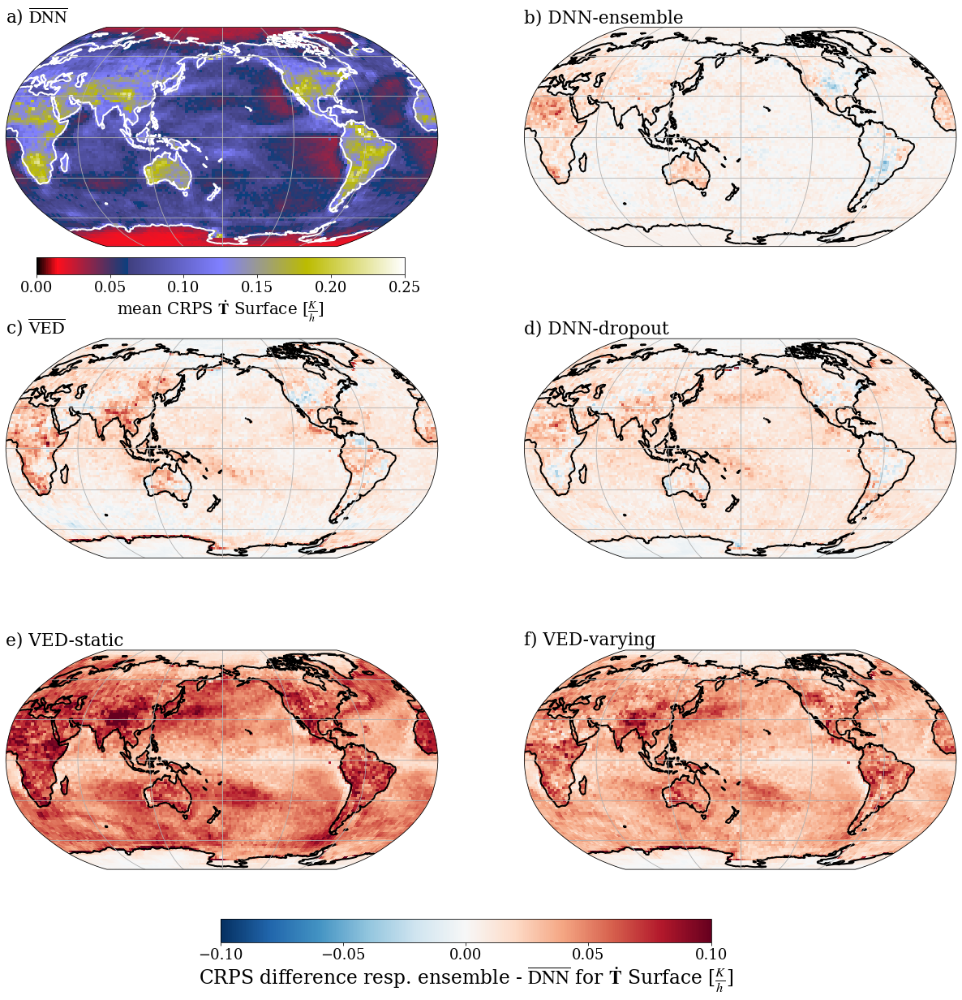

In [64]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,20))

imag=ax[0][0].pcolormesh(lon,lat,np.reshape(deter_7_ANN_lin_TBCTENDsurf_mean,(lat.size,lon.size)),
                                cmap=seism_TBC, vmin=vmin_3,vmax=vmax_3, 
                                transform=ccrs.PlateCarree())
ax[0][0].coastlines(color='white',linewidth=2)
ax[0][0].gridlines()
ax[0][0].set_title(r'a) $\overline{\mathrm{DNN}}$',loc='left')
cbar_ax=fig.add_axes([0.15, 0.651, 0.30, 0.015])
cb=plt.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{T}}$ Surface [$\frac{K}{h}$]",cax=cbar_ax,ticks=np.arange(0,0.28,5E-2),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{T}}$ Surface [$\frac{K}{h}$]",fontsize=fz*1.1)
             
imag_2=ax[0][1].pcolormesh(lon,lat,np.reshape(stoch_5_CRPS_TBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_T, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[0][1].coastlines(color='black',linewidth=2)
ax[0][1].gridlines()
ax[0][1].set_title(r'b) DNN-ensemble',loc='left')
    
cbar_ax_2 = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=plt.colorbar(imag_2,cax=cbar_ax_2,ticks=np.arange(-0.1,0.102,5E-2),orientation='horizontal')
cb.set_label(label=r"CRPS difference resp. ensemble - $\overline{\mathrm{DNN}}$ for $\mathbf{\dot{T}}$ Surface [$\frac{K}{h}$]",fontsize=fz*1.3)    


ax[1][0].pcolormesh(lon,lat,np.reshape(deter_VED_6_CRPS_TBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_T, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[1][0].coastlines(color='black',linewidth=2)
ax[1][0].gridlines()
ax[1][0].set_title(r'c) $\overline{\mathrm{VED}}$',loc='left')



ax[1][1].pcolormesh(lon,lat,np.reshape(ANN_dropout_CRPS_TBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_T, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[1][1].coastlines(color='black',linewidth=2)
ax[1][1].gridlines()
ax[1][1].set_title(r'd) DNN-dropout',loc='left')

ax[2][0].pcolormesh(lon,lat,np.reshape(static_VED_CRPS_TBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_T, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[2][0].coastlines(color='black',linewidth=2)
ax[2][0].gridlines()
ax[2][0].set_title(r'e) VED-static',loc='left')


ax[2][1].pcolormesh(lon,lat,np.reshape(varying_VED_CRPS_TBCTEND_diff,(lat.size,lon.size)),
                                cmap=seims_diff_T, vmin=-0.1,vmax=0.1, 
                                transform=ccrs.PlateCarree())
ax[2][1].coastlines(color='black',linewidth=2)
ax[2][1].gridlines()
ax[2][1].set_title(r'f) VED-varying',loc='left')



Text(0.0, 1.0, 'f) VED-varying')

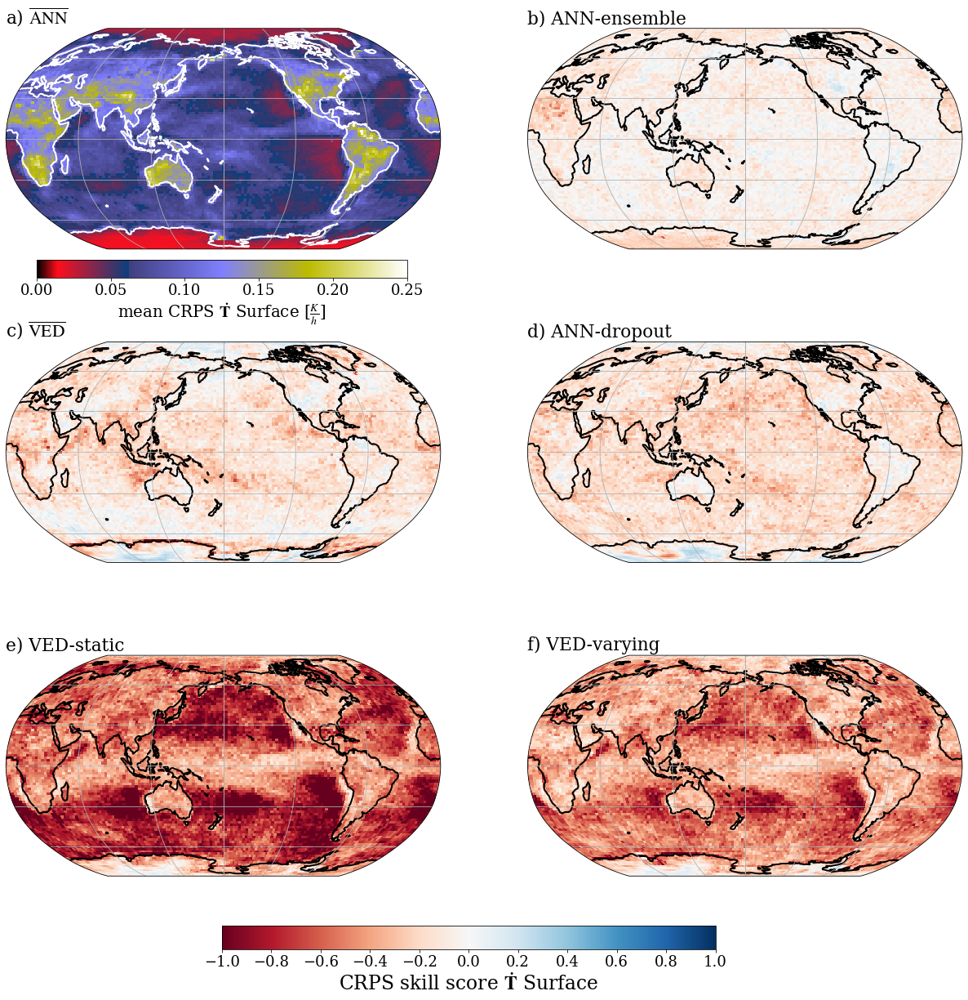

In [56]:
fig, ax = plt.subplots(3,2,subplot_kw={'projection':ccrs.Robinson(central_longitude=180)},figsize=(21,20))

imag=ax[0][0].pcolormesh(lon,lat,np.reshape(deter_7_ANN_lin_TBCTENDsurf_mean,(lat.size,lon.size)),
                                cmap=seism_TBC, vmin=vmin_3,vmax=vmax_3, 
                                transform=ccrs.PlateCarree())
ax[0][0].coastlines(color='white',linewidth=2)
ax[0][0].gridlines()
ax[0][0].set_title(r'a) $\overline{\mathrm{ANN}}$',loc='left')
cbar_ax=fig.add_axes([0.15, 0.651, 0.30, 0.015])
cb=plt.colorbar(imag, label=r"mean CRPS $\mathbf{\dot{T}}$ Surface [$\frac{K}{h}$]",cax=cbar_ax,ticks=np.arange(0,0.28,5E-2),orientation='horizontal')
cb.set_label(label=r"mean CRPS $\mathbf{\dot{T}}$ Surface [$\frac{K}{h}$]",fontsize=fz*1.1)
             
imag_2=ax[0][1].pcolormesh(lon,lat,np.reshape(stoch_5_CRPS_TBCTEND_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[0][1].coastlines(color='black',linewidth=2)
ax[0][1].gridlines()
ax[0][1].set_title(r'b) ANN-ensemble',loc='left')
    
cbar_ax_2 = fig.add_axes([0.3, 0.08, 0.40, 0.02])
cb=plt.colorbar(imag_2,cax=cbar_ax_2,ticks=np.arange(-1,1.022,2E-1),orientation='horizontal')
cb.set_label(label=r"CRPS skill score $\mathbf{\dot{T}}$ Surface",fontsize=fz*1.3)    


ax[1][0].pcolormesh(lon,lat,np.reshape(deter_VED_6_CRPS_TBCTEND_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[1][0].coastlines(color='black',linewidth=2)
ax[1][0].gridlines()
ax[1][0].set_title(r'c) $\overline{\mathrm{VED}}$',loc='left')



ax[1][1].pcolormesh(lon,lat,np.reshape(ANN_dropout_CRPS_TBCTEND_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[1][1].coastlines(color='black',linewidth=2)
ax[1][1].gridlines()
ax[1][1].set_title(r'd) ANN-dropout',loc='left')

ax[2][0].pcolormesh(lon,lat,np.reshape(static_VED_CRPS_TBCTEND_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[2][0].coastlines(color='black',linewidth=2)
ax[2][0].gridlines()
ax[2][0].set_title(r'e) VED-static',loc='left')


ax[2][1].pcolormesh(lon,lat,np.reshape(varying_VED_CRPS_TBCTEND_skill_score,(lat.size,lon.size)),
                                cmap=seims_skill_score, vmin=-1,vmax=1, 
                                transform=ccrs.PlateCarree())
ax[2][1].coastlines(color='black',linewidth=2)
ax[2][1].gridlines()
ax[2][1].set_title(r'f) VED-varying',loc='left')
